<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.it/cap01/cap01_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

# 1 Fondamenti e Primi Passi

Questo capitolo apre la **Parte 1** del libro, dedicata ai fondamenti dell'Elaborazione Digitale delle Immagini (EDI). Vengono presentati la rappresentazione matematica delle immagini digitali e i principali metodi per la loro manipolazione.

Si utilizza il linguaggio Python e la libreria `morph.py` (ZAMPIROLLI, 2025).

## 1.1 Obiettivi

Al termine di questo capitolo, sarai in grado di:

- Comprendere la natura fisica e matematica dell'immagine digitale $f(x,y)$.
- Identificare le bande dello spettro elettromagnetico rilevanti per l'elaborazione digitale delle immagini (PDI).
- Eseguire operazioni di base: lettura, visualizzazione e salvataggio delle immagini.
- Accedere e modificare le intensità dei pixel singolarmente.
- Applicare la sogliatura manuale.

- Configurare l’ambiente di sviluppo in Python.
- Gestire strutture di array (NumPy) senza incorrere in trappole di memoria.

## 1.2 Prima di iniziare: *Notebooks* interattivi

Questo materiale è stato realizzato secondo il concetto di ***Literate Programming*** (Programmazione Letteraria), ideato da Donald Knuth negli anni '80 (KNUTH, 1984). Knuth — anche creatore del sistema **TeX** per la tipografia digitale — propose che i programmi fossero scritti come una narrazione logica per gli esseri umani, alternando codice e documentazione.

Per eseguire una cella, premere <kbd>Shift</kbd> + <kbd>Invio</kbd> oppure fare clic sul pulsante ▶️.

> ### 📝 Nota sul formato
>
> Nelle versioni renderizzate (PDF o HTML), il codice è presentato in blocchi statici a scopo di lettura e riferimento. L'esecuzione interattiva richiede l'accesso tramite Google Colab (disponibile in cima alla pagina) o in ambiente locale con VSCode o Jupyter Notebook.

## 1.3 Fondamenti

Lo studio dei sistemi basati su immagini comprende un ecosistema di discipline integrate che trasformano dati visivi grezzi in conoscenza strutturata. Mentre alcune aree si concentrano sulla generazione di rappresentazioni, altre si dedicano al trattamento e all'analisi di tali dati per supportare applicazioni tecnologiche complesse.

Il diagramma presentato in [Figura 1.1](#fig-01-representacao) stabilisce la distinzione e la complementarità tra l'Elaborazione Digitale delle Immagini (EDI) e la Visione Artificiale (VA). L'EDI, evidenziata in **verde**, si concentra sulla trasformazione da immagine a immagine, mirando al miglioramento della qualità o alla pre-elaborazione, come la rimozione del rumore e l'accentuazione del contrasto.

Al contrario, la VA, contrassegnata in **blu**, si concentra sull'interpretazione del contenuto visivo per estrarre modelli o informazioni, come il riconoscimento di oggetti e gesti. La regione di intersezione illustra la sinergia tra le aree, dove l'EDI prepara i dati visivi per l'interpretazione da parte della VA. La mappa dimostra inoltre le interconnessioni di entrambe le discipline con aree quali la Robotica, la Grafica Computerizzata, l'Intelligenza Artificiale (IA) e le Neuroscienze.

<figure id="fig-01-representacao" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-pdf-vc.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.1:</strong> Diagramma relazionale che illustra le distinzioni fondamentali, le sinergie e le interconnessioni tra EDI e VA nel contesto dei sistemi basati su immagini.</figcaption>
</figure>

### 1.3.1 👁️ Visione Computazionale

- **Focus:** *Immagine → Modello* (percorso inverso rispetto alla Computer Grafica).
- **Obiettivo:** Estrarre informazioni di alto livello da immagini o video.
- **Applicazioni tipiche:**
  - Robotica: rilevamento di ostacoli, localizzazione e navigazione autonoma.
  - Sorveglianza e ispezione: riconoscimento di eventi, lettura di targhe, controllo qualità.
  - Telerilevamento: analisi di immagini satellitari, mappatura ambientale.
  - Imaging medico: rilevamento di tumori, segmentazione di organi, supporto alla diagnosi.
  - Interazione uomo-computer: riconoscimento di gesti, espressioni facciali, eye tracking.
- **Relazione con altri ambiti:** utilizza tecniche di Apprendimento Automatico e IA per classificare e interpretare le scene; funge da “occhi” della Robotica.

### 1.3.2 🖼️ Elaborazione Digitale delle Immagini (PDI)

- **Obiettivo:** *Immagine → Immagine* (generalmente - trasformazione di un'immagine in un'altra).  
- **Scopo:** Migliorare la qualità visiva o estrarre caratteristiche di basso livello.  
- **Applicazioni comuni:**
  - Rimozione del rumore (filtri media, mediana, gaussiano).
  - Miglioramento del contrasto (equalizzazione dell'istogramma, regolazione gamma).
  - Rilevamento dei bordi (Sobel, Canny, Laplaciano).
  - Segmentazione (sogliatura, crescita delle regioni, *watershed*).
  - Trasformazioni geometriche (ridimensionamento, rotazione, correzione prospettica).
- **Relazione con altre aree (vedi [Tabela 1.1](#tbl-01-relacoes)):**  
  - È la **base** per la maggior parte dei sistemi di visione artificiale (pre-elaborazione).  
  - La Computer Grafica applica spesso PDI per la post-elaborazione (es.: smussatura, miglioramento).  
  - Le tecniche di IA possono ottimizzare i parametri di elaborazione (es.: apprendimento di filtri).

<a id="tbl-01-relacoes"></a>

**Tabela 1.1:** Connessione tra PDI, VC e altre aree della scienza.

| Área                      | Relação com PDI e VC                                                                 |
|---------------------------|--------------------------------------------------------------------------------------|
| **Intelligenza Artificiale** | Fornisce modelli (reti neurali, SVM) che interpretano le uscite della VC.             |
| **Robotica** | Consuma dati di VC per prendere decisioni (navigazione, manipolazione).               |
| **Apprendimento Automatico**| Utilizza descrittori estratti da PDI/VC per addestrare classificatori.                |
| **Computer Grafica** | Percorso inverso: *modello → immagine*; spesso applica PDI per una resa realistica.    |
| **Neuroscienze** | Ispira modelli di PDI (es.: filtri simili alle cellule gangliari della retina).       |


## 1.4 Fasi del PDI

Le fasi del PDI sono presentate nella [Figura 1.2](#fig-01-etapas) e possono essere interpretate come una catena di trasformazioni che riduce la ridondanza dei dati per ricercarne il significato:

*   **Basso Livello:** opera direttamente sui pixel dell'immagine disturbata per apportare miglioramenti e filtraggi, producendo come output un'immagine pulita o esaltata.
*   **Medio Livello:** riceve l'immagine trattata ed esegue la segmentazione e la descrizione, trasformando la matrice dei pixel in attributi strutturati (forma, dimensione e texture).
*   **Alto Livello:** utilizza la tabella degli attributi per alimentare processi di logica e intelligenza artificiale, portando alla decisione o al riconoscimento finale (come la diagnosi medica).

<figure id="fig-01-etapas" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.2:</strong> Rappresentazione del flusso sequenziale di elaborazione: l'output di ciascun livello diventa l'input del livello successivo.</figcaption>
</figure>

La [Figura 1.3](#fig-01-etapas2) descrive l'intera sequenza dell'elaborazione delle immagini digitali (PDI), dall'acquisizione all'interpretazione. Il flusso inizia con l'Acquisizione dell'Immagine (1) e prosegue con il Miglioramento (2) e il Restauro (3). Successivamente, il contenuto viene isolato tramite la Segmentazione (4) e raffinato mediante la Morfologia (5). La transizione cruciale avviene nella Rappresentazione e Descrizione (6), dove gli oggetti visivi vengono convertiti in dati matematici (area, perimetro, ecc.), consentendo il Riconoscimento (7). I processi ausiliari includono l'Elaborazione dell'Immagine a Colori e la Compressione, che contribuiscono all'efficienza dell'archiviazione e dell'analisi.


<figure id="fig-01-etapas2" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas2.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.3:</strong> Flusso dettagliato del PDI: dall'acquisizione sensoriale all'estrazione di attributi e al riconoscimento automatizzato, includendo l'elaborazione a colori e la compressione.</figcaption>
</figure>

## 1.5 Formazione dell'Immagine e Spettro

Il processo di formazione di un'immagine si basa sull'interazione tra materia ed energia radiante. Essenzialmente, un'immagine viene concepita quando un **sensore registra la radiazione** risultante dall'interazione con un oggetto fisico. Nel contesto della visione umana e della fotografia convenzionale, questo fenomeno dipende da una sorgente luminosa che illumina la scena; le caratteristiche degli oggetti vengono quindi codificate attraverso le **variazioni di intensità e colore** della luce che raggiunge il sensore, come illustrato nella [Figura 1.4](#fig-01-luz).

<figure id="fig-01-luz" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-luz.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.4:</strong> Rappresentazione dello spettro visibile e della sua posizione rispetto alle altre radiazioni elettromagnetiche, evidenziando la variazione delle lunghezze d'onda da 380 nm a 750 nm.</figcaption>
</figure>

La **luce visibile** occupa solo una piccola banda dello spettro elettromagnetico — tra **380 nm (viola)** e **750 nm (rosso)** — come illustrato nella [Figura 1.5](#fig-01-espectro). I sensori digitali convenzionali operano in questa stessa finestra, ma apparecchiature specializzate possono captare radiazioni invisibili all’occhio umano, come l’infrarosso e i raggi X. In PDI, l’immagine formata dipende direttamente dalla sensibilità spettrale del sensore utilizzato.

<figure id="fig-01-espectro" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-espectro.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.5:</strong> \(A\) Spettro elettromagnetico completo in scala logaritmica, con evidenza della fascia visibile. (B) Dettaglio della luce visibile (380-750 nm) e dei suoi colori. (C) Scomposizione della luce bianca tramite prisma: la lunghezza d'onda minore subisce una rifrazione maggiore, separando UV, visibile e infrarosso.</figcaption>
</figure>

A partire da questo processo fisico di acquisizione, diventa possibile modellare matematicamente l'immagine digitale come una funzione bidimensionale discreta, nella quale ogni punto della scena è rappresentato da campioni numerici di intensità luminosa, formalizzando così i concetti di pixel e di immagine digitale presentati nella sezione successiva.

## 1.6 Cos'è un'Immagine Digitale?

Un'**immagine digitale** è formata da una griglia di **pixel** (*Picture Elements*), dove ogni pixel è la più piccola unità elementare dell'immagine.

> ### 💡 1.6.1 Cos'è un Pixel?
>
> Un **pixel** è la più piccola unità indirizzabile che compone un'immagine digitale. Ogni pixel occupa una posizione unica nella griglia e memorizza uno o più valori numerici che rappresentano la sua intensità o colore.

### Rappresentazione Matematica

A differenza di una funzione continua, il dominio di un'immagine digitale è un piano rettangolare finito $\mathbb{E} \subset \mathbb{Z}^2$, che rappresenta la griglia di campionamento. Questo dominio è indicizzato da coordinate intere:

<a id="eq-01-dominio"></a>
$$
\mathbb{E}  = \{ (x, y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H \} \tag{1.1}
$$


Dove:

*   **$L$**: rappresenta la larghezza dell'immagine (numero di colonne).
*   **$H$**: rappresenta l'altezza dell'immagine (numero di righe).

L'immagine digitale è una funzione che associa a ogni coppia di coordinate $(x,y)$ uno o più valori che descrivono l'aspetto del pixel.

<a id="eq-01-image"></a>
$$
f: \mathbb{E}  \to \mathcal{V} \tag{1.2}
$$


L'insieme $\mathcal{V}$ definisce i valori possibili per il pixel (codominio), variando a seconda del tipo di immagine, come dimostrato nella [Tabela 1.2](#tbl-01-tipos-imagem).

<a id="tbl-01-tipos-imagem"></a>

**Tabela 1.2:** Principali tipi di immagine digitale e i rispettivi insiemi di valori possibili per ogni pixel.

| Tipo di immagine | $\mathcal{V}$ (valori del pixel) | Rappresentazione |
|:---|:---|:---:|
| **Binaria** | $\{0, 1\}$ o $\{0, 255\}$ | ⬛◻️ |
| **Scala di grigi** | $\{0, 1, \dots, 255\}$ | ░▒▓█ |
| **A colori (RGB)** | $\{0, \dots, 255\}^3$ (terne ordinate di valori) | 🟥🟩🟦 |


**Esempio pratico:** Un'immagine a colori nel modello RGB può essere rappresentata matematicamente da una funzione che associa tre valori di intensità a ogni pixel. Computazionalmente, questa rappresentazione corrisponde a tre matrici sovrapposte — i canali rosso (*Red*), verde (*Green*) e blu (*Blue*) — nelle quali ogni elemento memorizza l'intensità luminosa del rispettivo canale in una determinata posizione dell'immagine.

Per rendere possibili gli esperimenti pratici di PDI e VC, questo libro utilizza l'ecosistema scientifico di Python, integrando librerie orientate alla manipolazione matriciale, all'elaborazione delle immagini e alla visualizzazione dei risultati, presentate di seguito.

## 1.7 Configurazione dell'Ambiente

Questo materiale utilizza l'ecosistema scientifico di Python, con particolare attenzione a
**NumPy** (calcolo matriciale), **OpenCV** (visione computazionale) e alla
libreria **morph.py** (ZAMPIROLLI, 2025), sviluppata per scopi
didattici e utilizzata lungo tutto questo libro, come presentato nella
[Tabela 1.3](#tbl-01-bibliotecas).

Il progetto è attualmente disponibile in **Python** e **Portoghese**. La sua
organizzazione, tuttavia, consente l'espansione ad altri linguaggi di
programmazione e idiomi.

Gli **Esercizi di Programmazione (EP)** presentati alla fine dei capitoli
possono essere validati dal modulo `testsuite.py`, che consente di eseguire casi di
test in diversi linguaggi, tra cui Python, C, C++, Java, JavaScript e
R. In questo modo, gli stessi casi di test possono essere utilizzati per verificare
le soluzioni sviluppate nei *notebook* e nel **Moodle/VPL**.

<a id="tbl-01-bibliotecas"></a>

**Tabela 1.3:** Principali librerie e moduli utilizzati in questo libro per il
calcolo matriciale, PDI, VC, visualizzazione e validazione degli esercizi.

| Libreria         | Funzione principale                                   |
| :--------------- | :---------------------------------------------------- |
| `numpy`          | Rappresentazione matriciale e operazioni numeriche    |
| `opencv-python`  | Lettura, scrittura e operazioni di visione computazionale |
| `matplotlib`     | Visualizzazione di immagini e grafici                 |
| `morph.py`       | Astrazione didattica delle operazioni di PDI          |
| `testsuite.py`   | Esecuzione e validazione automatica degli EP          |


## 1.8 Versioni di `morph.py`

La libreria `morph.py` ha due versioni pubbliche:

* **Versione 1.0** — versione originale, pubblicata insieme all'articolo
  presentato all'EduComp 2024:
  [repository della versione 1.0](https://github.com/fzampirolli/morph)

* **Versione 1.1** — versione utilizzata nelle attività di questo libro:
  [repository della versione 1.1](https://github.com/fzampirolli/pdi-vc/blob/master/morph/morph.py)

La versione 1.1 è stata adattata per soddisfare anche i vincoli di memoria del
**Moodle/VPL** (Laboratorio Virtuale di Programmazione). Nella versione 1.0, alcune
librerie, come `matplotlib`, `requests` e `skimage`, venivano caricate al
momento dell'`import morph`. In ambienti con risorse limitate, questo
caricamento poteva superare il limite di memoria e produrre errori come
`Jail: out of memory, 128MiB`.

Nella versione 1.1, questi *import* sono stati sostituiti da **caricamento
*lazy***: ogni libreria viene importata solo dal metodo che effettivamente
la utilizza. Così, il comando `import morph` mantiene il caricamento iniziale
ridotto, utilizzando principalmente `numpy` e `cv2`, mentre le risorse
aggiuntive vengono caricate su richiesta.

La configurazione dei *notebook* è centralizzata nel file `config.py`,
disponibile nello stesso repository. Questo file verifica le dipendenze,
cerca di garantire l'uso di **OpenCV 5.0** e mette a disposizione `morph.py` e, quando
necessario, `testsuite.py`. Quando l'ambiente non dispone della versione adeguata
di OpenCV, `config.py` può reinstallare la versione richiesta e, se necessario,
richiedere il riavvio dell'ambiente di esecuzione.

In questo modo, i *notebook* utilizzano un'unica routine di configurazione,
riducendo la ripetizione di codice e facilitando la riproduzione dell'ambiente
computazionale utilizzato in questo libro.

In [1]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True)
from morph import mm
from testsuite import TestSuite

✅ Ambiente pronto. Morph: 1.1.9 | OpenCV: 5.0.0 | TestSuite: 1.1.2


## 1.9 Fondamenti di Matrici — attenzione alla copia di riferimenti

Poiché un'immagine digitale può essere rappresentata da una matrice, è importante comprendere come creare e manipolare correttamente le matrici. In Python, esiste una trappola comune nell'utilizzo dell'operatore `*` con le liste:

> ### ⚠️ Attenzione alla copia di riferimenti
>
> Eseguendo `m = [[0]*2]*3`, non vengono create tre righe indipendenti. Vengono invece create tre riferimenti alla **stessa lista**. Di conseguenza, la modifica di un elemento in una delle righe modificherà anche l'elemento corrispondente nelle altre righe.

Per visualizzare questo comportamento, si può eseguire il codice su [Python Tutor](https://pythontutor.com/) e confrontarlo con il metodo corretto per creare una matrice utilizzando le liste: `m = [[0]*2 for _ in range(3)]`.

In pratica, per l'elaborazione digitale delle immagini (EDI), si raccomanda di utilizzare **NumPy**, che fornisce strutture dati multidimensionali efficienti e operazioni vettorizzate adatte alla manipolazione delle immagini. Il codice seguente presenta diversi modi di creare immagini sintetiche, i cui risultati sono mostrati nella [Figura 1.6](#fig-imagens-sinteticas).

Matrice casuale generata:
 24  64 121  86 233 147 
 20 254 245 131  74  96 
227 198 102 111 183  92 
229 157  23 212 231 149 



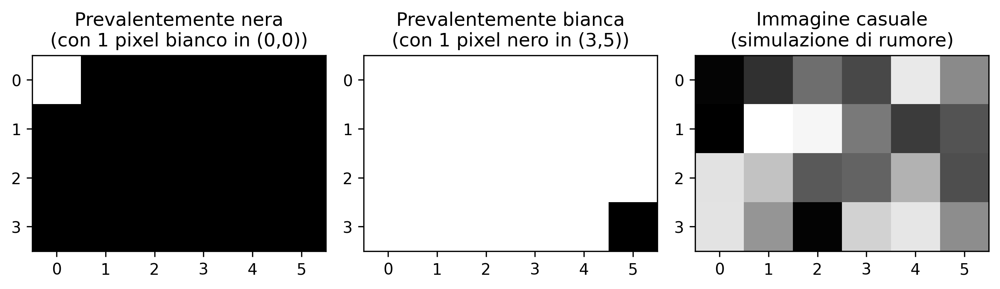

**Figura 1.6:** Esempi di immagini sintetiche rappresentate matricialmente.


In [2]:
import numpy as np

# Creando un'immagine nera (zeri) di 4, 6 pixel
img_preta = np.zeros((4, 6), dtype='uint8')
img_preta[0,0] = 255  # pixel bianco nell'angolo in alto a sinistra

# Creando un'immagine bianca (255) di 4, 6 pixel
img_branca = np.ones((4, 6), dtype='uint8') * 255
img_branca[3,5] = 0  # pixel nero nell'angolo in basso a destra

# Creando un'immagine casuale per test (rumore)
img_random = mm.randomImage(4, 6, maxValue=255)

print("Matrice casuale generata:")
print(mm.drawImg(img_random))

mm.show(
    [img_preta, img_branca, img_random],
    titles=[
        "Prevalentemente nera\n(con 1 pixel bianco in (0,0))",
        "Prevalentemente bianca\n(con 1 pixel nero in (3,5))",
        "Immagine casuale\n(simulazione di rumore)"
    ],
    cols=3,
    figsize=(9, 3),
    axis=True
)

## 1.10 Lettura e Visualizzazione delle Immagini

Nelle librerie come [NumPy](https://numpy.org/?utm_source=chatgpt.com), [OpenCV](https://opencv.org/?utm_source=chatgpt.com) e [scikit-image](https://scikit-image.org/?utm_source=chatgpt.com), le immagini digitali sono spesso rappresentate computazionalmente come *array* di NumPy. In questo modo, operazioni matriciali e concetti di algebra lineare possono essere applicati direttamente all'elaborazione digitale delle immagini (EDI).

Una delle operazioni fondamentali nell'elaborazione delle immagini digitali è la lettura delle immagini.

Nella libreria `morph.py`, la funzione `mm.read()` consente di caricare immagini sia da file locali che da URL, come illustrato nella [Figura 1.7](#fig-01-natureza)..

Dimensioni (H, W, Canali): (1365, 2048, 3)
Tipo di dato: uint8


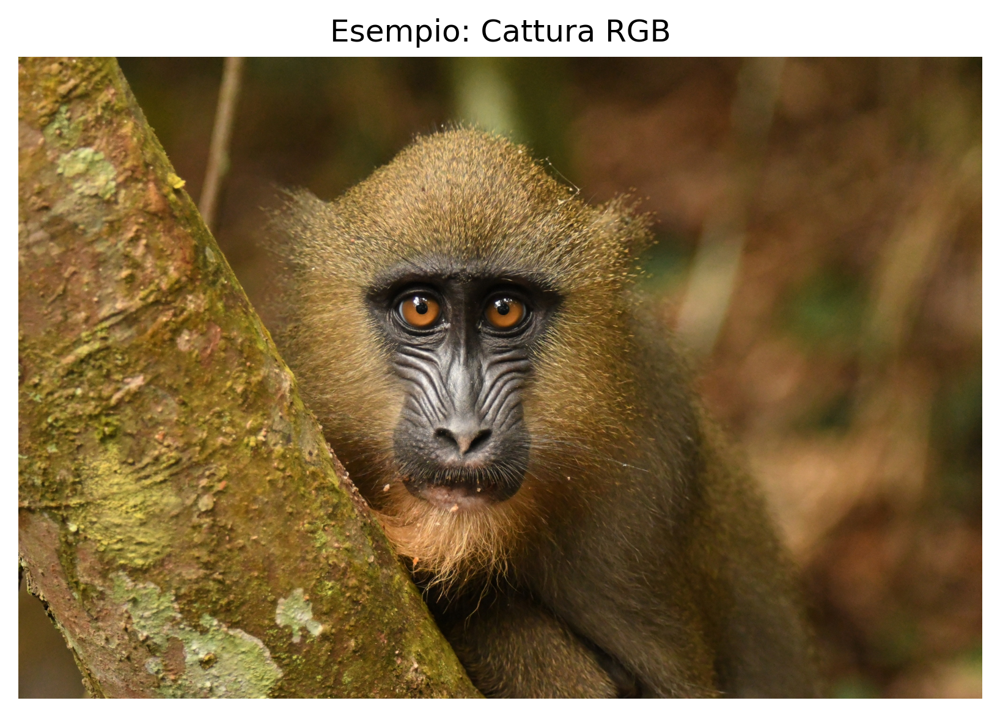

**Figura 1.7:** Mandrill (Mandrillus sphinx) in ambiente naturale. Credito: Julien Renoult (CC BY 4.0).


In [3]:
import os
import numpy as np

url     = "https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg"
caminho = "imagens/mandrill.png"

if not os.path.exists(caminho):
    os.makedirs("imagens", exist_ok=True)
    img_obj = mm.read(url, pil=True)
    mm.write(img_obj, caminho)
else:
    img_obj = mm.read(caminho, pil=True)

img = np.array(img_obj)

print(f"Dimensioni (H, W, Canali): {img.shape}")
print(f"Tipo di dato: {img.dtype}")

mm.show(img, title="Esempio: Cattura RGB")

### Alternativa: *Download* dell'Immagine in Archiviazione Locale

In ambienti in cui la lettura diretta degli URL non è disponibile — a causa di restrizioni di rete, policy di *firewall* o assenza di connettività — un'alternativa consiste nell'eseguire preventivamente il *download* dell'immagine sul file system locale. Dopo l'archiviazione, l'immagine può essere caricata normalmente tramite la funzione `mm.read()`. Nell'esempio seguente, il file viene salvato localmente con il nome `mandrill.png`.

```bash
!wget -O mandrill.png \
    https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
```

```python
img = mm.read('mandrill.png')
mm.show(img, title="Esempio: Acquisizione RGB (file locale)")
```

#### Spiegazione

* `wget -O mandrill.png <URL>` esegue il *download* dell'immagine e la archivia localmente con il nome specificato;
* `mm.read('mandrill.png')` effettua la lettura del file direttamente dal file system, senza la necessità di ulteriori richieste HTTP;
* questa strategia riduce la dipendenza dalla connettività durante l'esecuzione degli esperimenti ed evita *download* ripetuti della stessa immagine.

> ### 💡 Nota
>
> Il prefisso `!` viene utilizzato in ambienti basati su *notebook*, come [Jupyter Notebook](https://jupyter.org/?utm_source=chatgpt.com), [JupyterLab](https://jupyter.org/?utm_source=chatgpt.com) e [Google Colab](https://colab.research.google.com/?utm_source=chatgpt.com), per eseguire comandi del sistema operativo direttamente in celle di codice. Su terminali convenzionali, il comando deve essere utilizzato senza il prefisso `!`.
>
> Qualora l'utilità `wget` non sia installata, si può utilizzare in alternativa:
>
> ```bash
> !curl -o mandrill.png \
>     https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
> ```

## 1.11 Conversione di Tipi e Soglia

Come abbiamo visto, un'immagine a colori nello spazio RGB è rappresentata dalla funzione:

<a id="eq-01-cinza"></a>
$$
f: \mathbb{E} \to \{0,1,\dots,255\}^3
$$

Cioè, per ogni pixel $(x,y)$, abbiamo tre valori $(R,G,B)$ che ne definiscono il colore.

### Conversione in Scala di Grigi

Per convertire un'immagine RGB in scala di grigi (*grayscale*), è necessario combinare i tre canali in un unico valore di intensità $g$, che rappresenta la luminosità percepita. Poiché l'occhio umano non è ugualmente sensibile al rosso, al verde e al blu, si utilizza una **media ponderata**. Lo standard [ITU-R BT.601](https://www.itu.int/rec/R-REC-BT.601/) ({ITU-R}, 2011) definisce i seguenti pesi:

$$
g = 0.299\,R + 0.587\,G + 0.114\,B \tag{1.3}
$$


Dopo il calcolo, il valore $g$ viene arrotondato all'intero più vicino e adattato all'intervallo $[0, 255]$. Il risultato è una nuova immagine, ora in scala di grigi, rappresentata da:

<a id="eq-01-limiar"></a>
$$
f_{\text{grigi}}: \mathbb{E} \to \{0,1,\dots,255\}
$$

### Soglia (*Thresholding*)

A partire dall'immagine in scala di grigi $f_{\text{grigi}}(x,y)$, un'operazione fondamentale è la **soglia**, che produce un'immagine **binaria** (solo bianco e nero). A tale scopo, si sceglie un valore di taglio $T$ (generalmente nell'intervallo $[0,255]$) e si definisce:

$$
f_{\text{bin}}(x,y) = 
\begin{cases} 
255 & \text{se } f_{\text{grigi}}(x,y) > T \\[4pt]
0 & \text{altrimenti}
\end{cases} \tag{1.4}
$$


**Esempio:** Con $T = 128$, i pixel con intensità superiore a 128 diventano bianchi (255); gli altri diventano neri (0).

La soglia è ampiamente utilizzata per **segmentare gli oggetti dallo sfondo**, estrarre i bordi o creare maschere binarie per l'elaborazione successiva.

> **Nota:** Il valore 255 rappresenta il bianco massimo nelle immagini a 8 bit, mentre 0 rappresenta il nero assoluto.

### Esempio pratico di conversione e soglia

La [Figura 1.8](#fig-01-processamento-basico) illustra i passaggi principali per trasformare un'immagine a colori in scala di grigi e, successivamente, convertirla in un'immagine binaria mediante soglia.
Il codice seguente implementa questi passaggi:

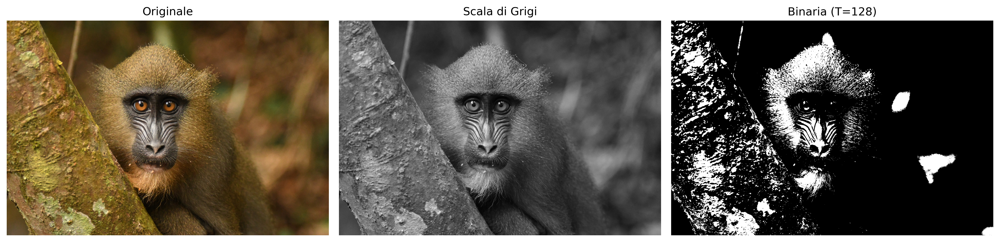

**Figura 1.8:** Elaborazione base delle immagini: (a) immagine originale, (b) immagine in scala di grigi, (c) immagine binarizzata con soglia (T=128).


In [4]:
# 1. Converti in Scala di Grigi
img_gray = mm.gray(img)

# 2. Applica soglia (Pixel > 128 diventano 255, altri 0)
limiar = 128
img_binaria = mm.threshold(img_gray, limiar)

# Uso della nuova funzione
mm.show(
    [img, img_gray, img_binaria], 
    titles=["Originale", "Scala di Grigi", f"Binaria (T={limiar})"],
    cols=3
)

## 1.12 Limiarizzazione con il metodo di Otsu

Come presentato in [Equação 1.4](#eq-01-limiar), la limiarizzazione converte un’immagine in toni di grigio in un’immagine binaria utilizzando un valore di soglia $T$. Finora abbiamo fissato manualmente $T = 128$.

```python
img_bin_fixo = mm.threshold(img_gray, T=128)
```

Tuttavia, la scelta manuale di $T$ non è sempre banale. La libreria `mm` offre un’alternativa automatica: quando il parametro `limiar` **non viene fornito**, la funzione `mm.threshold(img_gray)` calcola il valore di $T$ mediante il **metodo di Otsu** (OTSU, 1979). Questo metodo, che verrà dettagliato nei capitoli successivi, massimizza la varianza tra le classi dell’istogramma (frequenza di ciascun tono di grigio), separando automaticamente i pixel dell’oggetto e dello sfondo.

Il codice seguente confronta la limiarizzazione manuale ($T=128$) con quella automatica (Otsu), mostrando anche il valore di $T$ calcolato:

Soglia calcolata da Otsu: T = 95.0


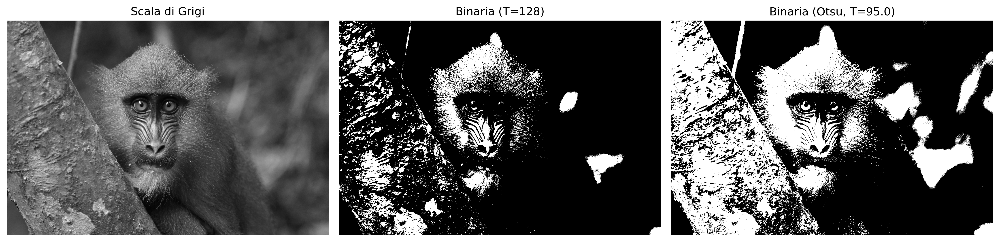

**Figura 1.9:** Confronto tra sogliatura manuale (T=128) e automatica (Otsu) sull


In [5]:
import cv2
# Sogliatura con T fisso (manuale)
T_fixo = 128
img_bin_fixo = mm.threshold(img_gray, T_fixo)

# Sogliatura con il metodo di Otsu (T automatico)
T_otsu, img_bin_otsu = cv2.threshold(img_gray, 0, 255,
                                      cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f'Soglia calcolata da Otsu: T = {T_otsu}')
# o semplicemente:
# img_bin_otsu = mm.threshold(img_gray)

# Visualizzazione affiancata
mm.show(
    [img_gray, img_bin_fixo, img_bin_otsu], 
    titles=["Scala di Grigi", f"Binaria (T={T_fixo})", f"Binaria (Otsu, T={T_otsu})"],
    cols=3
)

La [Figura 1.9](#fig-01-otsu) mostra che la soglia ottenuta mediante Otsu si adatta automaticamente all'immagine, producendo una binarizzazione più efficace rispetto a un valore fisso, soprattutto quando le intensità dell'oggetto e dello sfondo sono ben separate nell'istogramma. Questa tecnica è ampiamente utilizzata nei sistemi di visione artificiale (VC) per la binarizzazione di documenti, il rilevamento di oggetti e il pre-processing delle immagini.

> ### 💡 Semplicità della libreria `morph.py`
>
> Mentre OpenCV richiede la chiamata completa:
>
> ```python
> T_otsu, img_bin = cv2.threshold(img_gray, 0, 255,
>                                 cv2.THRESH_BINARY + cv2.THRESH_OTSU)
> ```
>
> la libreria `mm` astrae tutta questa complessità: basta chiamare `mm.threshold(img_gray)`. La soglia di Otsu viene calcolata automaticamente e l'immagine binaria viene restituita direttamente. Questo approccio consente di concentrarsi sul concetto, non sui dettagli implementativi.

## 1.13 Accesso ai Pixel

In Python con NumPy, un'immagine è strutturata come un **array multidimensionale**. L'accesso a un pixel specifico utilizza la convenzione matriciale **riga** (asse Y) e **colonna** (asse X): `img[riga, colonna]`.

Il codice della [Figura 1.10](#fig-01-pixel-acesso) dimostra come estrarre questi valori in immagini a colori (RGB) e in scala di grigi, oltre a isolare l'intorno immediato del punto di interesse.

📌 VALORI NEL PIXEL TARGET (600, 800):
   • Toni di grigio (Scalare) : 81
   • Colorato (Vettore RGB)    : R=92, G=78, B=67
--------------------------------------------------
🔍 MATRICE DELL'INTORNO 3x3 IN TONI DI GRIGIO:
   (Il pixel target centrale è evidenziato con tra parentesi quadre)

     83    96   105 
     85  [ 81]   96 
     83    77    84 


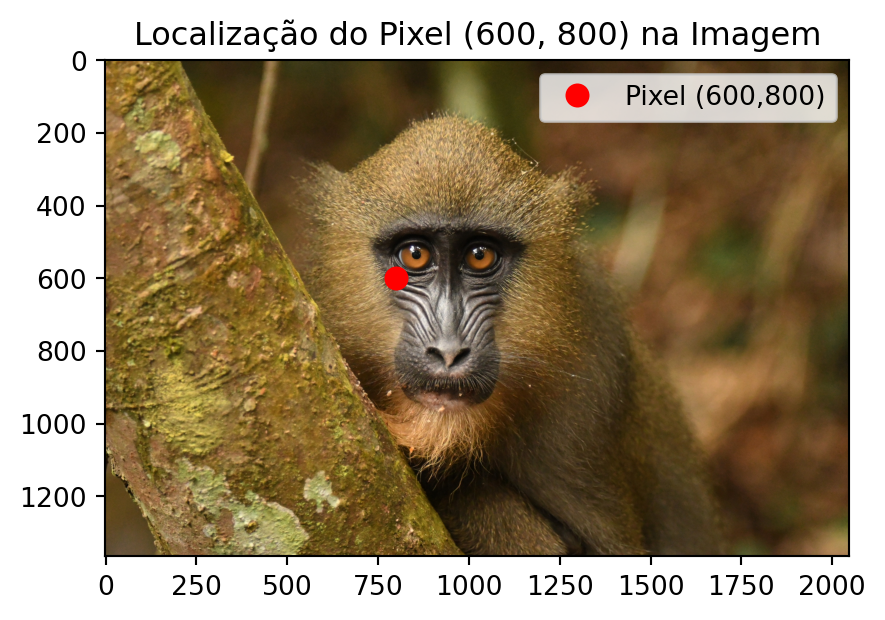

**Figura 1.10:** Accesso a un pixel specifico (r, c) e la rappresentazione del suo intorno nell


In [6]:
import matplotlib.pyplot as plt

# 1. Definizione delle coordinate del pixel target
r, c = 600, 800

# 2. Accesso diretto ai valori dei pixel
pixel_cinza = img_gray[r, c]
pixel_rgb   = img[r, c]

print(f"📌 VALORI NEL PIXEL TARGET ({r}, {c}):")
print(f"   • Toni di grigio (Scalare) : {pixel_cinza}")
print(f"   • Colorato (Vettore RGB)    : R={pixel_rgb[0]}, G={pixel_rgb[1]}, B={pixel_rgb[2]}")
print("-" * 50)

# 3. Visualizzazione didattica dell'intorno 3x3 attorno al pixel (r, c)
# Ritaglia dalla riga r-1 alla r+1, e dalla colonna c-1 alla c+1
vizinhanca_gray = img_gray[r-1:r+2, c-1:c+2]

print(f"🔍 MATRICE DELL'INTORNO 3x3 IN TONI DI GRIGIO:")
print(f"   (Il pixel target centrale è evidenziato con tra parentesi quadre)\n")

# Stampa formattata per evidenziare il pixel centrale
for i, linha in enumerate(vizinhanca_gray):
    linhas_str = []
    for j, valor in enumerate(linha):
        if i == 1 and j == 1:
            linhas_str.append(f"[{valor:3d}]") # Evidenzia il centro (100, 100)
        else:
            linhas_str.append(f" {valor:3d} ")
    print("   " + " ".join(linhas_str))

# 4. Dimostrazione visiva usando il mm.show (opzionale, ma eccellente per il libro)
# Mostra l'immagine intera con un punto che delimita la regione
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.plot(c, r, 'ro', markersize=8, label=f'Pixel ({r},{c})') # Traccia (x, y) -> (c, r)
plt.title(f"Localização do Pixel ({r}, {c}) na Imagem")
plt.legend()
plt.axis('on') # Mantiene gli assi per lo studente per vedere le coordinate 100, 100
plt.show()

**Spiegazione riga per riga:**

1. `img_gray[r, c]` — Restituisce un singolo valore intero (scalare) compreso tra 0 e 255, che rappresenta l'intensità di luminosità del grigio.
2. `img[r, c]` — Restituisce un vettore con tre valori `[R, G, B]`, corrispondenti alle intensità dei canali Rosso, Verde e Blu.
3. `img_gray[r-1:r+2, c-1:c+2]` — Esegue un'affettatura (*slicing*) per estrarre la sottomatrice $3\times 3$ attorno al pixel. Questa operazione è alla base per l'implementazione di filtri spaziali e convoluzioni.
4. Il ciclo `for` successivo formatta semplicemente tale sottomatrice nella console, mostrando il pixel centrale tra parentesi quadre `[ ]` a scopo didattico.
5. La funzione `plt.plot(c, r, 'ro')` traccia un punto rosso sull'immagine per correlare la coordinata numerica con la sua posizione visiva. Si noti che Matplotlib utilizza l'ordine predefinito dello schermo `(X, Y)`, invertendolo in `(c, r)`.

Poiché l'indicizzazione in Python inizia da zero (*zero-based*), l'angolo superiore sinistro dell'immagine è la coordinata `(0,0)`. Ricorda sempre questa regola: la prima dimensione della matrice controlla l'**altezza** (righe/Y) e la seconda controlla la**larghezza** (colonne/X).

## 1.14 Riassunto

In questo capitolo sono stati presentati i fondamenti della rappresentazione delle immagini digitali: la definizione di pixel, la strutturazione delle immagini in matrici e l'impatto del campionamento e della quantizzazione sulla qualità finale:

- **Immagine digitale** = funzione $f(x,y)$ che mappa coordinate in intensità (scalari o vettoriali).
- **Dominio**: insieme finito $\mathbb{E} = \{(x,y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H\}$.
- **Tipi principali**: binaria ($\mathcal{V} = \{0, 255\}$), toni di grigio ($\mathcal{V} = [0,255]$) e RGB ($\mathcal{V} = [0,255]^3$).
- **Sogliatura** converte i toni di grigio in immagine binaria; il **metodo di Otsu** determina automaticamente il valore di soglia massimizzando la varianza tra le classi.

- La libreria `morph.py` (o `mm`) offre funzioni didattiche per operazioni di base dell'elaborazione delle immagini, come `mm.gray()`, `mm.threshold()`, `mm.show_multiple()`.
- **Insidia NumPy**: non usare mai `[[0]*n]*m` per creare matrici — usa sempre `np.zeros()` o `np.ones()`.
- Accesso ai pixel tramite `img[riga, colonna]`, con indicizzazione ***zero-based***.

Il Capitolo 2 tratterà **istogrammi ed equalizzazione del contrasto**.

## 1.15 🤖 Uso del Gemini Notebook come Tutor Complementare

In questa edizione, oltre ai *notebook* interattivi su Google Colab, il **Gemini Notebook** è disponibile come strumento complementare di studio. La piattaforma utilizza esclusivamente i documenti forniti dall'autore come base di conoscenza, garantendo risposte coerenti con il contenuto del libro.

> ### ❗ 🎓 Studia con il Tutor Intelligente
>
> Accedi all'ambiente del capitolo tramite il *link* qui sotto ed esplora in particolare le opzioni **Guida allo Studio** e **Conversazione** per approfondire la tua comprensione.
>
> [🚀 ACCEDI AL GEMINI NOTEBOOK: CAPITOLO 01](https://notebooklm.google.com/notebook/022d09fb-4dee-46b1-ad18-787987fe976d)
>
> #### 🌐 Lingua e Linguaggio di Programmazione
>
> Il progetto di questo capitolo nel Gemini Notebook è stato costruito esclusivamente con il testo in **portoghese** e gli esempi di codice in **Python**. Se stai studiando dall'edizione in inglese o francese, oppure seguendo il percorso in C++, le risposte del tutor potrebbero non corrispondere esattamente alla versione che stai leggendo.
>
> #### ⚠️ Avvertenza sul Contenuto Generato dall'IA
>
> L'IA è un potente alleato nello studio, ma il contenuto generato può contenere **errori o imprecisioni**. Consulta sempre **libri, articoli scientifici e altre fonti accademiche affidabili** per validare le informazioni. Quando possibile, esegui gli esempi pratici forniti in questo capitolo per verificare i risultati.

### Funzionalità Disponibili sulla Piattaforma

Il **Gemini Notebook** offre una suite avanzata di strumenti basati sull'IA per trasformare il contenuto statico del libro in un'esperienza di apprendimento dinamica e multimediale. La piattaforma utilizza tecniche di **RAG** (*Retrieval-Augmented Generation*), fondate sul lavoro di Lewis (2020), per basare le risposte strettamente sui documenti forniti e minimizzare il verificarsi di allucinazioni.

Le principali funzionalità includono:

* **Sintesi Multimodali (Audio e Video)**: Generazione di conversazioni naturali tra esperti nel formato di **Sintesi Audio** (stile *podcast*) e **Sintesi Video**, che discutono i temi centrali del capitolo, come le differenze tra PDI e VC, o l'interpretazione di trasformazioni come la sogliatura e il metodo di Otsu.
* **Visualizzazione di Strutture (Mappa Mentale e Infografica)**: Creazione automatica di diagrammi che collegano visivamente i concetti, ad esempio, il flusso di elaborazione dalla cattura dell'immagine digitale, passando per la conversione in toni di grigio, la sogliatura e la segmentazione binaria.
* **Strumenti di Valutazione (Test e Schede Didattiche)**: Generazione di **Test** a scelta multipla e **Schede Didattiche** (*flashcards*) per il consolidamento delle conoscenze, basati sul testo d'autore (es.: domande sulla formula di conversione RGB→grigio o sul funzionamento della soglia globale e di Otsu).
* **Supporto alla Presentazione (*Slide* e Relazioni)**: Assistenza nella strutturazione di **Presentazioni di *Slide*** e nella redazione di **Relazioni** tecniche, facilitando la comunicazione dei risultati di esperimenti con le immagini.
* **Analisi dei Dati (Tabella Dati)**: Organizzazione dei dati estratti dal testo in tabelle strutturate, aiutando la comprensione di esempi pratici, come il confronto tra diversi valori di soglia.
* ***Chat* Contestualizzata**: Consente di porre domande dirette sul codice e sulla teoria, come: *"Come implementare la conversione da RGB a toni di grigio utilizzando i pesi dello standard ITU‑R BT.601?"* o *"Cosa succede all'immagine binaria se scelgo una soglia T=200 invece di T=128?"*.

## 1.16 Elenco di Esercizi

1. (15%) Con le tue parole, definisci **immagine digitale** e **pixel**. Fornisci un esempio concreto di come un'immagine a colori (RGB) è rappresentata in forma matriciale nel computer.

2. (15%) Spiega le differenze tra **immagine binaria**, **toni di grigio (8 bit)** e **a colori RGB**, indicando l'intervallo di valori possibili per ogni pixel in ciascun tipo.

3. (20%) Considerando la formula di conversione RGB → toni di grigio dello standard ITU‑R BT.601:
   $$g = 0.299\,R + 0.587\,G + 0.114\,B$$
   Calcola il valore del pixel in toni di grigio per $(R,G,B) = (80, 180, 30)$. Arrotonda al numero intero più vicino.

4. (20%) Che cos'è la **sogliatura** (*thresholding*)? Spiega la differenza tra scegliere una soglia $T$ fissa (es.: $T=128$) e utilizzare il **metodo di Otsu** per la determinazione automatica della soglia. In poche parole, come sceglie la soglia il metodo di Otsu?

5. (15%) Nel contesto della libreria didattica `mm` discussa nel capitolo, rispondere:
   - a) (7,5%) Come si accede al valore del pixel nella posizione (riga=50, colonna=60) di un'immagine in scala di grigi `img_gray`?
   - b) (7,5%) Qual è il vantaggio di usare `mm.threshold(img_gray)` senza passare la soglia? Confrontare con la chiamata equivalente in OpenCV.

6. (15%) Cosa restituisce la proprietà `img.shape` per un'immagine NumPy in formato RGB? Fornire un esempio concreto con un'immagine di 640×480 pixel.

## Riferimenti del Capitolo

La base teorica di questo capitolo comprende le seguenti opere di PDI e VC:

* Gonzalez (2018) per i fondamenti di **Elaborazione Digitale delle Immagini** (EDI).
* Singh (2019) per l'implementazione pratica di metodi di **elaborazione e analisi delle immagini**.
* Szeliski (2022) per lo studio di VC e algoritmi fondamentali.
* Bradski (2008) per l'applicazione della libreria **OpenCV** in ambiente Python.
* Lewis (2020) per il concetto di **generazione aumentata da recupero (RAG)**, utilizzato a supporto dell'elaborazione delle informazioni di questo materiale.

------------------------------------------------------------------------


<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.it/cap01/cap01.EPs_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

## 1.17 💻 **Parte pratica con esercizi di programmazione**

### 🎯 Obiettivo di questo Quaderno

Gli **Esercizi di Programmazione (EPs)** presentati di seguito possono essere sottomessi anche in attività Moodle (attività VPL) che forniscono *feedback* automatico.

**Questo quaderno è stato sviluppato per superare le limitazioni d'uso di Moodle.** Con esso, si deve:

1. **Sviluppare:** Scrivere e modificare la propria soluzione direttamente nell'ambiente Colab.
2. **Validare:** Testare il proprio codice localmente utilizzando gli **stessi casi di test** di Moodle.
3. **Organizzare:** Salvare in modo sicuro i propri codici delle attività VPL.
4. **Valutare:** Quando si è connessi a Moodle, basta copiare la propria soluzione e cliccare su **Valuta** in Moodle (**se si è nella rete UFABC**) per registrare il proprio voto ufficiale.

### ⚙️ Istruzioni Passo a Passo

In un ambiente di esecuzione (come VSCode, Jupyter o Colab), seguire l'ordine seguente per configurare l'ambiente e validare i propri esercizi:

#### Preparazione dell'Ambiente
Eseguire la cella di codice seguente per scaricare `morph.py` e `testsuite.py` dal repository della disciplina — solo se non sono già presenti nella directory locale. Con entrambi in `./`, il *notebook* e i sottoprocessi del `TestSuite` trovano il modulo senza configurazioni aggiuntive di percorso.

*Nota:* Lo script `testsuite.py` cercherà automaticamente i casi di test in `all/{cap}/cases` su [GitHub](https://github.com/fzampirolli/pdi-vc/tree/master/all).

#### Scrittura del Codice
Salvare la propria soluzione in una cella di codice utilizzando il comando magico `%%writefile`. Il nome del file deve seguire il pattern `EPX_Y.*`, dove `X` è il capitolo, `Y` è l'esercizio e `*` è l'estensione del linguaggio.

> **Esempio:** `%%writefile EP01_01.py`

#### *Download*

Scaricare `morph.py` e `testsuite.py` eseguendo la cella seguente:

In [7]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True)
from morph import mm
from testsuite import TestSuite

✅ Ambiente pronto. Morph: 1.1.9 | OpenCV: 5.0.0 | TestSuite: 1.1.2


#### Esecuzione dei Test
Dopo aver salvato il file con la tua soluzione, esegui il comando seguente (in una nuova cella) per valutare i test automatici:

```python
TestSuite("EP01_01.extensão").run()
```

Sostituisci l'estensione in base al linguaggio utilizzato:

| Linguaggio | Estensione |
|-----------|----------|
| Python    | `.py`    |
| Java      | `.java`  |
| C         | `.c`     |
| C++       | `.cpp`   |
| JavaScript| `.js`    |
| R         | `.r`     |



> **Come funziona:** Il `TestSuite` scarica i casi di test da GitHub, esegue il tuo programma con ciascun input e confronta l'output con quello atteso – calcolando automaticamente il tuo voto.


Per testare codice Python direttamente, senza salvare file, usa `run_code(codice)` passando il codice come *stringa* in una variabile `codice`:

```python
codice = """
from morph import mm
# 1 ... il tuo codice qui ...
"""
TestSuite("EP04_01").run_code(codice)
```

### ⚠️ Importante: Regole e Buone Pratiche

#### 🔹 Sull'Inserimento dei Dati

Il tuo programma deve leggere l'input standard (tastiera).

* **Python:** Utilizza `input()`.
* **Altri linguaggi:** Utilizza il comando di lettura standard equivalente (`cin`, `Scanner`, ecc.).

#### 🔹 Configurazione dell'IA su Colab

Per un migliore apprendimento, si consiglia di disattivare il completamento automatico del codice tramite IA, poiché non sarà disponibile durante le valutazioni. Ad esempio, nel browser Chrome:

* Vai su: **Strumenti > Impostazioni > IA generativa**
* Deseleziona: **Abilita generazione di codice**

#### 🔹 Integrità Accademica (Plagio)

Questa risorsa di test locali si applica a ES **senza variazioni**. Tuttavia:

* **Individualità:** Ogni studente deve sviluppare la propria soluzione.
* **Rilevamento di Similarità:** Il professore utilizza strumenti che rilevano copie, **anche con modifica di nomi di variabili o spazi bianchi**.

### 1.0.1 EP01_01 📏 Tre metriche di distanza nella PDA (Processamento Digitale delle Immagini)

In questa attività, devi scrivere un programma che calcoli le tre distanze classiche nella PDA: **Euclidea (L2)**, **City-Block (L1)** e ***Chessboard* (L∞)**.

* Leggi **4 numeri reali** che rappresentano le coordinate: $A_x, A_y, B_x, B_y$.
* Calcola le tre distanze utilizzando le formule:

$$d_{\text{Euclidea}} = \sqrt{(B_x - A_x)^2 + (B_y - A_y)^2}$$

$$d_{\text{City-block}} = |B_x - A_x| + |B_y - A_y|$$

$$d_{\text{Chessboard}} = \max\big(|B_x - A_x|,\; |B_y - A_y|\big)$$

* Stampa i tre risultati, ciascuno su una riga, formattati con **due cifre decimali**, nell'ordine: **Euclidea**, ***City-block***, ***Chessboard***.

📌 **Importante**:

* Utilizza le funzioni matematiche standard del tuo linguaggio: `math.sqrt`, `abs` (o `fabs`) e `max`.
* L'output deve contenere **solo i numeri** (uno per riga), senza testi aggiuntivi.
* Consulta un simulatore interattivo per questo esercizio nella **[Figura 1.11](#fig-01-sim-ep0101-distancia)** (grafico con trascinamento dei punti e visualizzazione delle tre metriche).

#### 1.0.1.1 🖼️ Perché è importante? – Costo computazionale

In un'immagine **1000×1000 pixel** (1 milione di pixel), calcolare la distanza di ogni pixel da un punto di riferimento richiede **1 milione di operazioni**. La scelta della metrica influisce sulle prestazioni:

| Metrica | Operazioni per pixel | Costo relativo (1M pixel) | Quando utilizzarla |
| --- | --- | --- | --- |
| **Euclidea (L2)** | 2 sottrazioni, 2 moltiplicazioni, 1 somma, 1 `sqrt` | 🔴 Più costosa – `sqrt` è dispendiosa | Distanza "reale" nello spazio continuo |
| ***City-block* (L1)** | 2 sottrazioni, 2 `abs`, 1 somma | 🟡 Moderata – senza radice quadrata | Griglie, robotica, immagini binarie |
| ***Chessboard* (L∞)** | 2 sottrazioni, 2 `abs`, 1 `max` | 🟢 Più efficiente | Movimenti di pezzi, morfologia |

La funzione `sqrt` è computazionalmente più costosa rispetto ad operazioni come addizione, sottrazione, moltiplicazione e valore assoluto. Nelle CPU moderne, la differenza può essere piccola (circa 1,5× a 3×), ma nei sistemi embedded o nei cicli di milioni di iterazioni, qualsiasi guadagno conta. Per questo motivo, **quando l'obiettivo è solo confrontare le distanze** (es.: trovare il punto più vicino), utilizza la **distanza euclidea al quadrato**.

#### 1.0.1.2 📋 Compito (specifica per VPL)

**Input:**  
Un'unica riga con quattro numeri reali: `Ax Ay Bx By`

**Output:**  
Tre righe, ciascuna con un numero reale con due cifre decimali (Euclidea, City-block, Chessboard).


#### 1.0.1.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| `0`<br>`0`<br>`3`<br>`4` | `5.00`<br>`7.00`<br>`4.00` | Triangolo 3-4-5 |
| `0`<br>`0`<br>`1`<br>`1` | `1.41`<br>`2.00`<br>`1.00` | Diagonale unitaria |

**Esempio di test di `sqrt` in Python, con `timeit` che isola ogni operazione:**

In [8]:
import math
import timeit

N = 50_000_000

def apenas_soma():
    a, b = 3.0, 4.0
    return a + b

def soma_e_sqrt():
    a, b = 3.0, 4.0
    return math.sqrt(a*a + b*b)

t_soma = timeit.timeit(apenas_soma, number=N)
t_sqrt = timeit.timeit(soma_e_sqrt, number=N)

print(f"Somma semplice       : {t_soma:.3f} s")
print(f"Somma + sqrt        : {t_sqrt:.3f} s")
print(f"Rapporto (sqrt/somma)  : {t_sqrt/t_soma:.2f}x")

Somma semplice       : 2.548 s
Somma + sqrt        : 4.684 s
Rapporto (sqrt/somma)  : 1.84x


In [9]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0101-distancia" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP01_01: Metriche di Distanza nello Spazio Discreto</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Euclidea vs City-block vs Scacchiera</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Clicca e trascina i punti <b>A</b> o <b>B</b> nel piano cartesiano o regola le loro coordinate qui sotto per confrontare le tre metriche di distanza in tempo reale.</p>

    <!-- Cards de Exibição das Métricas -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(180px, 1fr));gap:10px;margin-bottom:16px;">
      
      <!-- Euclidiana -->
      <div style="background:#f4f0fd;border-radius:12px;padding:10px;text-align:center;border:1px solid #dcd0f9;">
        <div style="font-size:10px;font-weight:700;letter-spacing:.3px;color:#6b46c1;">📐 EUCLIDEA (L2)</div>
        <div id="sim_ep0101_dispE" style="font-size:24px;font-weight:700;font-family:monospace;color:#6b46c1;margin:2px 0;">5.00</div>
        <div style="font-size:9px;font-family:monospace;color:#805ad5;">√(Δx² + Δy²)</div>
      </div>

      <!-- City-block -->
      <div style="background:#e8f8f5;border-radius:12px;padding:10px;text-align:center;border:1px solid #a3e4d7;">
        <div style="font-size:10px;font-weight:700;letter-spacing:.3px;color:#117a65;">🧱 CITY-BLOCK (L1)</div>
        <div id="sim_ep0101_dispC" style="font-size:24px;font-weight:700;font-family:monospace;color:#117a65;margin:2px 0;">7.00</div>
        <div style="font-size:9px;font-family:monospace;color:#16a085;">|Δx| + |Δy|</div>
      </div>

      <!-- Chessboard -->
      <div style="background:#fdebd0;border-radius:12px;padding:10px;text-align:center;border:1px solid #f8c471;">
        <div style="font-size:10px;font-weight:700;letter-spacing:.3px;color:#b9770e;">🏁 SCACCHIERA (L∞)</div>
        <div id="sim_ep0101_dispX" style="font-size:24px;font-weight:700;font-family:monospace;color:#b9770e;margin:2px 0;">4.00</div>
        <div style="font-size:9px;font-family:monospace;color:#d68910;">max(|Δx|, |Δy|)</div>
      </div>

    </div>

    <!-- Layout Interativo: Canvas + Painel de Controle -->
    <div style="display:flex;flex-wrap:wrap;gap:16px;">
      
      <!-- Lado Esquerdo: Canvas Plano Cartesiano -->
      <div style="flex:2;min-width:260px;">
        <canvas id="sim_ep0101_canvas" width="380" height="280" style="display:block;width:100%;height:auto;background:#fafaf7;border-radius:12px;border:1px solid #e4dcc8;cursor:crosshair;touch-action:none;"></canvas>
        <div style="font-size:9.5px;text-align:center;margin-top:6px;color:#8a8371;">👆 Trascina i punti <b>A (Viola)</b> o <b>B (Arancione)</b> sulla griglia.</div>
      </div>

      <!-- Lado Direito: Controles Numéricos de Posição -->
      <div style="flex:1.2;min-width:180px;display:flex;flex-direction:column;gap:10px;">
        
        <!-- Ponto A -->
        <div style="background:#fafaf7;border-radius:12px;border:1px solid #e9e3d3;padding:10px;">
          <div style="font-size:11px;font-weight:700;display:flex;align-items:center;gap:6px;margin-bottom:8px;color:#26241d;">
            <span style="display:inline-block;width:10px;height:10px;background:#6b46c1;border-radius:50%;"></span> Punto A
          </div>
          <div style="display:flex;align-items:center;gap:6px;margin-bottom:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">Ax</label>
            <input type="number" id="sim_ep0101_axN" value="0" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_axR" min="-7" max="7" value="0" step="0.5" style="flex:1;cursor:pointer;">
          </div>
          <div style="display:flex;align-items:center;gap:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">Ay</label>
            <input type="number" id="sim_ep0101_ayN" value="0" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_ayR" min="-7" max="7" value="0" step="0.5" style="flex:1;cursor:pointer;">
          </div>
        </div>

        <!-- Ponto B -->
        <div style="background:#fafaf7;border-radius:12px;border:1px solid #e9e3d3;padding:10px;">
          <div style="font-size:11px;font-weight:700;display:flex;align-items:center;gap:6px;margin-bottom:8px;color:#26241d;">
            <span style="display:inline-block;width:10px;height:10px;background:#b9770e;border-radius:50%;"></span> Punto B
          </div>
          <div style="display:flex;align-items:center;gap:6px;margin-bottom:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">Bx</label>
            <input type="number" id="sim_ep0101_bxN" value="3" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_bxR" min="-7" max="7" value="3" step="0.5" style="flex:1;cursor:pointer;">
          </div>
          <div style="display:flex;align-items:center;gap:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">By</label>
            <input type="number" id="sim_ep0101_byN" value="4" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_byR" min="-7" max="7" value="4" step="0.5" style="flex:1;cursor:pointer;">
          </div>
        </div>

        <!-- Botão Reset -->
        <button id="sim_ep0101_btnReset" style="background:#26241d;color:#7ee7c6;border:none;border-radius:9px;font-size:11px;font-weight:700;padding:8px 0;cursor:pointer;width:100%;font-family:monospace;">⟳ Reset A(0,0) & B(3,4)</button>

      </div>

    </div>

    <!-- Legenda Inferior -->
    <div style="font-size:10px;text-align:center;padding:8px 12px;margin-top:14px;color:#8a8371;border-top:1px solid #e4dcc8;background:#fafaf7;border-radius:8px;">
      <b>Legenda Geometrica:</b> Linea tratteggiata (Euclidea), Percorso ortogonale a L (City-block) ed Evidenziazione della dimensione massima (Scacchiera).<br>
      <div style="display:flex;gap:16px;justify-content:center;margin-top:6px;flex-wrap:wrap;">
        <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:16px;height:2px;background:#6b46c1;"></span> Euclidea</span>
        <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:16px;height:2px;background:#117a65;"></span> City-block</span>
        <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:16px;height:4px;background:#b9770e;"></span> Scacchiera (Max)</span>
      </div>
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0101(root){
    if (!root || root.dataset.simEp0101Init) return;
    root.dataset.simEp0101Init = "1";

    var canvas = root.querySelector('#sim_ep0101_canvas');
    var ctx = canvas.getContext('2d');
    var width = 380, height = 280;
    canvas.width = width; canvas.height = height;

    var axN = root.querySelector('#sim_ep0101_axN'), axR = root.querySelector('#sim_ep0101_axR');
    var ayN = root.querySelector('#sim_ep0101_ayN'), ayR = root.querySelector('#sim_ep0101_ayR');
    var bxN = root.querySelector('#sim_ep0101_bxN'), bxR = root.querySelector('#sim_ep0101_bxR');
    var byN = root.querySelector('#sim_ep0101_byN'), byR = root.querySelector('#sim_ep0101_byR');

    var dispE = root.querySelector('#sim_ep0101_dispE');
    var dispC = root.querySelector('#sim_ep0101_dispC');
    var dispX = root.querySelector('#sim_ep0101_dispX');
    var btnReset = root.querySelector('#sim_ep0101_btnReset');

    var xMin = -6.5, xMax = 7.8;
    var yMin = -5.2, yMax = 7.2;

    function worldToCanvas(x, y) {
      var px = ((x - xMin) / (xMax - xMin)) * width;
      var py = height - ((y - yMin) / (yMax - yMin)) * height;
      return { x: px, y: py };
    }

    function canvasToWorld(px, py) {
      var x = xMin + (px / width) * (xMax - xMin);
      var y = yMin + ((height - py) / height) * (yMax - yMin);
      return { x: x, y: y };
    }

    function getVals() {
      return {
        ax: parseFloat(axN.value) || 0,
        ay: parseFloat(ayN.value) || 0,
        bx: parseFloat(bxN.value) || 0,
        by: parseFloat(byN.value) || 0
      };
    }

    function updateAll() {
      var v = getVals();
      axR.value = v.ax; ayR.value = v.ay;
      bxR.value = v.bx; byR.value = v.by;

      var dx = v.bx - v.ax;
      var dy = v.by - v.ay;

      var eucl = Math.hypot(dx, dy);
      var city = Math.abs(dx) + Math.abs(dy);
      var chess = Math.max(Math.abs(dx), Math.abs(dy));

      dispE.textContent = eucl.toFixed(2);
      dispC.textContent = city.toFixed(2);
      dispX.textContent = chess.toFixed(2);

      drawCanvas(v.ax, v.ay, v.bx, v.by);
    }

    function drawCanvas(ax, ay, bx, by) {
      ctx.clearRect(0, 0, width, height);

      // Grade Discreta
      ctx.lineWidth = 0.6;
      ctx.strokeStyle = "#e4dcc8";
      for (var i = -6; i <= 8; i++) {
        var p1 = worldToCanvas(i, yMin), p2 = worldToCanvas(i, yMax);
        ctx.beginPath(); ctx.moveTo(p1.x, p1.y); ctx.lineTo(p2.x, p2.y); ctx.stroke();
        var p3 = worldToCanvas(xMin, i), p4 = worldToCanvas(xMax, i);
        ctx.beginPath(); ctx.moveTo(p3.x, p3.y); ctx.lineTo(p4.x, p4.y); ctx.stroke();
      }

      // Eixos Cartesiano Princpiais
      ctx.beginPath();
      ctx.moveTo(worldToCanvas(xMin, 0).x, worldToCanvas(xMin, 0).y);
      ctx.lineTo(worldToCanvas(xMax, 0).x, worldToCanvas(xMax, 0).y);
      ctx.moveTo(worldToCanvas(0, yMin).x, worldToCanvas(0, yMin).y);
      ctx.lineTo(worldToCanvas(0, yMax).x, worldToCanvas(0, yMax).y);
      ctx.strokeStyle = "#8a8371"; ctx.lineWidth = 1.2; ctx.stroke();

      ctx.font = "9px monospace"; ctx.fillStyle = "#8a8371";
      for (var tick = -6; tick <= 7; tick += 2) {
        if (tick !== 0) {
          var ptX = worldToCanvas(tick, 0); ctx.fillText(tick, ptX.x - 4, ptX.y - 4);
          var ptY = worldToCanvas(0, tick); ctx.fillText(tick, ptY.x + 4, ptY.y + 3);
        }
      }

      var pA = worldToCanvas(ax, ay), pB = worldToCanvas(bx, by);
      var dx = bx - ax, dy = by - ay;
      var absDx = Math.abs(dx), absDy = Math.abs(dy);

      ctx.save();

      // ── Chessboard (L_infty) - Lado Máximo
      ctx.strokeStyle = "#b9770e";
      ctx.setLineDash([]);

      if (absDx >= absDy) {
        ctx.lineWidth = 5;
        ctx.beginPath(); ctx.moveTo(pA.x, pA.y); ctx.lineTo(pB.x, pA.y); ctx.stroke();
        ctx.lineWidth = 1.2; ctx.setLineDash([4, 4]); ctx.globalAlpha = 0.5;
        ctx.beginPath(); ctx.moveTo(pB.x, pA.y); ctx.lineTo(pB.x, pB.y); ctx.stroke();
      } else {
        ctx.lineWidth = 5;
        ctx.beginPath(); ctx.moveTo(pA.x, pA.y); ctx.lineTo(pA.x, pB.y); ctx.stroke();
        ctx.lineWidth = 1.2; ctx.setLineDash([4, 4]); ctx.globalAlpha = 0.5;
        ctx.beginPath(); ctx.moveTo(pA.x, pB.y); ctx.lineTo(pB.x, pB.y); ctx.stroke();
      }
      ctx.globalAlpha = 1.0;
      ctx.setLineDash([]);

      // ── City-block (L1) - Trajeto Ortogonal
      ctx.beginPath();
      ctx.moveTo(pA.x, pA.y);
      ctx.lineTo(pB.x, pA.y);
      ctx.lineTo(pB.x, pB.y);
      ctx.strokeStyle = "#117a65"; ctx.lineWidth = 2.2;
      ctx.stroke();

      // ── Euclidiana (L2) - Reta Direta
      ctx.beginPath();
      ctx.moveTo(pA.x, pA.y);
      ctx.lineTo(pB.x, pB.y);
      ctx.strokeStyle = "#6b46c1"; ctx.lineWidth = 2.0; ctx.setLineDash([6, 6]);
      ctx.stroke();
      ctx.setLineDash([]);

      // ── Desenho dos Pontos A e B
      function drawPoint(px, py, color, label) {
        ctx.beginPath(); ctx.arc(px, py, 9, 0, 2 * Math.PI);
        ctx.fillStyle = color + "33"; ctx.fill();
        ctx.beginPath(); ctx.arc(px, py, 6, 0, 2 * Math.PI);
        ctx.fillStyle = color; ctx.fill();
        ctx.fillStyle = "#ffffff";
        ctx.font = "bold 9px 'Inter', sans-serif";
        ctx.textAlign = "center"; ctx.textBaseline = "middle";
        ctx.fillText(label, px, py);
      }

      drawPoint(pA.x, pA.y, "#6b46c1", "A");
      drawPoint(pB.x, pB.y, "#b9770e", "B");

      ctx.fillStyle = "#6b46c1"; ctx.font = "bold 9.5px monospace"; ctx.textAlign = "left";
      ctx.fillText("A(" + ax.toFixed(1) + "," + ay.toFixed(1) + ")", pA.x + 10, pA.y - 6);

      ctx.fillStyle = "#b9770e"; ctx.font = "bold 9.5px monospace"; ctx.textAlign = "left";
      ctx.fillText("B(" + bx.toFixed(1) + "," + by.toFixed(1) + ")", pB.x + 10, pB.y - 6);

      ctx.restore();
    }

    function bindNumRange(num, range) {
      num.addEventListener('input', function() { range.value = num.value; updateAll(); });
      range.addEventListener('input', function() { num.value = range.value; updateAll(); });
    }

    bindNumRange(axN, axR); bindNumRange(ayN, ayR);
    bindNumRange(bxN, bxR); bindNumRange(byN, byR);

    btnReset.addEventListener('click', function() {
      axN.value = 0; ayN.value = 0;
      bxN.value = 3; byN.value = 4;
      updateAll();
    });

    // Eventos de Arraste de Pontos no Canvas
    var dragging = null;

    function getCanvasCoords(e) {
      var rect = canvas.getBoundingClientRect();
      var scaleX = canvas.width / rect.width;
      var scaleY = canvas.height / rect.height;
      var clientX = e.clientX, clientY = e.clientY;

      if (e.touches && e.touches.length > 0) {
        clientX = e.touches[0].clientX;
        clientY = e.touches[0].clientY;
      }

      return {
        x: Math.min(Math.max(0, (clientX - rect.left) * scaleX), width),
        y: Math.min(Math.max(0, (clientY - rect.top) * scaleY), height)
      };
    }

    function distToPoint(cx, cy, wx, wy) {
      var p = worldToCanvas(wx, wy);
      return Math.hypot(p.x - cx, p.y - cy);
    }

    function onStart(e) {
      var coords = getCanvasCoords(e);
      var v = getVals();
      if (distToPoint(coords.x, coords.y, v.ax, v.ay) < 16) {
        dragging = 'A';
      } else if (distToPoint(coords.x, coords.y, v.bx, v.by) < 16) {
        dragging = 'B';
      }
      if (dragging) canvas.style.cursor = 'grabbing';
    }

    function onMove(e) {
      if (!dragging) return;
      if (e.cancelable) e.preventDefault();
      var coords = getCanvasCoords(e);
      var w = canvasToWorld(coords.x, coords.y);
      var rx = Math.round(Math.min(xMax - 0.2, Math.max(xMin + 0.2, w.x)) * 2) / 2;
      var ry = Math.round(Math.min(yMax - 0.2, Math.max(yMin + 0.2, w.y)) * 2) / 2;

      if (dragging === 'A') { axN.value = rx; ayN.value = ry; }
      else { bxN.value = rx; byN.value = ry; }
      updateAll();
    }

    function onEnd() {
      dragging = null;
      canvas.style.cursor = 'crosshair';
    }

    canvas.addEventListener('mousedown', onStart);
    window.addEventListener('mousemove', onMove);
    window.addEventListener('mouseup', onEnd);

    canvas.addEventListener('touchstart', onStart, { passive: false });
    window.addEventListener('touchmove', onMove, { passive: false });
    window.addEventListener('touchend', onEnd);

    updateAll();
  }

  function tryInitSimEP0101(){
    var root = document.getElementById('sim-ep0101-distancia');
    if (root) initSimEP0101(root); else setTimeout(tryInitSimEP0101, 200);
  }
  tryInitSimEP0101();
})();
</script>
</div>
""")

**Figura 1.11:** Simulatore EP01_01: Distanze Euclidea, City-block e Chessboard


#### 1.0.1.4 🐍 Python

Basta creare una normale cella di codice e inserire il codice Python. L'input può essere simulato usando `input()`, che funziona normalmente.

Esempio di cella:

In [10]:
%%writefile EP01_01.py
# Codice Python
x1,y1,x2,y2 = int(input()), int(input()), int(input()), int(input())
# Calcolo delle differenze
dx = abs(x2 - x1)
dy = abs(y2 - y1)

# 1. Distanza Euclidea (L2)
dist_euclidiana = (dx**2 + dy**2)**0.5

# 2. Distanza City-block / Manhattan (L1)
dist_city_block = dx + dy

# 3. Distanza Scacchiera / Chebyshev (Linf)
dist_chessboard = max(dx, dy)

# Output formattato secondo i casi di test
print(f"{dist_euclidiana:.2f}")
print(f"{dist_city_block:.2f}")
print(f"{dist_chessboard:.2f}")

Overwriting EP01_01.py


In [11]:
# Aspetta che tu inserisca 4 numeri interi eseguendo questa cella.
# In Jupyter o Google Colab, la magia %run -i permette allo script di leggere dalla tastiera.
# In un terminale comune, useresti: python3 EP01_01.py (senza il '!' e senza '%run').

# %run -i EP01_01.py

In [12]:
# Invia 4 interi come input standard (stdin) allo script EP01_01.py usando una pipe
!echo -e "0\n0\n4\n4" | python3 EP01_01.py

5.66
8.00
4.00


In [13]:
TestSuite("EP01_01.py").run()

#### 1.0.1.5 ☕ Java

Per eseguire Java in Colab, è necessario utilizzare una cella con il prefisso `%%writefile` per salvare il codice in un file, compilarlo ed eseguirlo.

In [14]:
%%writefile EP01_01.java
import java.util.Scanner;

class EP01_01 {
    public static void main(String[] args) {
        Scanner s = new Scanner(System.in);
        
        double x1 = s.nextDouble(), y1 = s.nextDouble();
        double x2 = s.nextDouble(), y2 = s.nextDouble();
        
        double dx = Math.abs(x2 - x1);
        double dy = Math.abs(y2 - y1);
        
        System.out.printf("%.2f\n", Math.sqrt(dx*dx + dy*dy));
        System.out.printf("%.2f\n", dx + dy);
        System.out.printf("%.2f\n", Math.max(dx, dy));
    }
}

Overwriting EP01_01.java


In [15]:
!javac EP01_01.java
!echo -e "0\n0\n4\n4" | java EP01_01

5,66
8,00
4,00


In [16]:
TestSuite("EP01_01.java").run()

#### 1.0.1.6 💻 C

Analogamente, usa `%%writefile` per salvare il codice, poi compila ed esegui. Per C, utilizziamo il compilatore **GCC**.

In [17]:
# Installare il compilatore GCC e gli strumenti di build
# build-essential include gcc, g++, make, ecc.
import platform, shutil, subprocess

def instalar_gcc():
    if shutil.which("gcc"):
        print("✅ GCC già disponibile."); return
    if platform.system() != "Linux":
        print("⚠️ Mac: xcode-select --install | Windows: WSL o MinGW"); return
    try: import google.colab; cmd = ["apt-get", "install", "-y", "build-essential"]
    except ImportError:       cmd = ["sudo", "apt-get", "install", "-y", "build-essential"]
    subprocess.run(cmd, check=True)
    print("✅ build-essential installato!")

instalar_gcc()

✅ GCC già disponibile.


In [18]:
%%writefile EP01_01.c
#include <stdio.h>
#include <math.h>

int main() {
    double x1, y1, x2, y2;
    if (scanf("%lf %lf %lf %lf", &x1, &y1, &x2, &y2) != 4) return 0;

    double dx = fabs(x2 - x1);
    double dy = fabs(y2 - y1);

    // Euclidiana, City-block e Chessboard
    printf("%.2f\n", sqrt(dx * dx + dy * dy));
    printf("%.2f\n", dx + dy);
    printf("%.2f\n", fmax(dx, dy));

    return 0;
}

Overwriting EP01_01.c


In [19]:
# Compila il file .c generando l'eseguibile EP01_01
# -lm viene usato per linkare la libreria matematica (math.h) se necessario

!gcc EP01_01.c -o EP01_01 -lm
!echo -e "0\n0\n4\n4" | ./EP01_01

5.66
8.00
4.00


In [20]:
TestSuite("EP01_01.c").run()

#### 1.0.1.7 💻 C++

Analogamente al Java, usa `%%writefile` per salvare il codice, poi compila ed esegui. Ricorda che, in Colab, è necessario installare anche quanto segue:

In [21]:
# Installa il compilatore G++ per C++
# Il build-essential include g++, make, ecc.
import platform, shutil, subprocess

def instalar_gpp():
    if shutil.which("g++"):
        print("✅ G++ già disponibile."); return
    if platform.system() != "Linux":
        if platform.system() == "Darwin":
            print("⚠️ Mac: xcode-select --install")
        else:
            print("⚠️ Windows: usa WSL o MinGW (https://www.mingw-w64.org)")
        return
    try: import google.colab; cmd = ["apt-get", "install", "-y", "build-essential"]
    except ImportError:       cmd = ["sudo", "apt-get", "install", "-y", "build-essential"]
    subprocess.run(cmd, check=True)
    print("✅ Compilatore C++ pronto.")

instalar_gpp()

✅ G++ già disponibile.


In [22]:
%%writefile EP01_01.cpp
#include <iostream>
#include <iomanip>
#include <cmath>
#include <algorithm>

int main() {
    double x1, y1, x2, y2;
    if (!(std::cin >> x1 >> y1 >> x2 >> y2)) return 0;

    double dx = std::abs(x2 - x1);
    double dy = std::abs(y2 - y1);

    std::cout << std::fixed << std::setprecision(2);
    
    // Euclidiana, City-block e Chessboard
    std::cout << std::sqrt(dx*dx + dy*dy) << std::endl;
    std::cout << (dx + dy) << std::endl;
    std::cout << std::max(dx, dy) << std::endl;

    return 0;
}

Overwriting EP01_01.cpp


In [23]:
!g++ EP01_01.cpp -o EP01_01
!echo -e "0\n0\n4\n4" | ./EP01_01

5.66
8.00
4.00


In [24]:
TestSuite("EP01_01.cpp").run()

#### 1.0.1.8 🌐 JavaScript (Node.js)

Per JavaScript, usa `%%writefile` per creare il file ed eseguilo con Node:

In [25]:
%%writefile EP01_01.js
function escreva(s) { try { document.write(s + "<br>"); } catch(e) { console.log(s); } }

process.stdin.once('data', data => {
  const valores = data.toString().trim().split(/\s+/);
  const x1 = parseFloat(valores[0]);
  const y1 = parseFloat(valores[1]);
  const x2 = parseFloat(valores[2]);
  const y2 = parseFloat(valores[3]);

  const dx = Math.abs(x2 - x1);
  const dy = Math.abs(y2 - y1);

  // Euclidiana, City-block e Chessboard
  escreva(Math.sqrt(dx * dx + dy * dy).toFixed(2));
  escreva((dx + dy).toFixed(2));
  escreva(Math.max(dx, dy).toFixed(2));
});

Overwriting EP01_01.js


In [26]:
TestSuite("EP01_01.js").run()

#### 1.0.1.9 📊 R

In Colab è possibile eseguire codice R direttamente utilizzando la magia `%%R`.  
Il programma deve leggere **quattro numeri** (x1, y1, x2, y2) e mostrare la distanza euclidea con **due cifre decimali**.

Esempio di cella:

```r
%%R
dados <- scan(file = "stdin", n = 4, quiet = TRUE)
x1 <- dados[1]; y1 <- dados[2]; x2 <- dados[3]; y2 <- dados[4]
dist <- sqrt((x2 - x1)^2 + (y2 - y1)^2)
cat(sprintf("%.2f", dist))
```

In [27]:
# Installare R e Rscript
# Il pacchetto r-base installa l'ambiente R completo, inclusi Rscript
import platform, shutil, subprocess

def instalar_r():
    if shutil.which("R"):
        print("✅ R già disponibile."); return
    if platform.system() != "Linux":
        if platform.system() == "Darwin":
            print("⚠️ Mac: https://cran.r-project.org/bin/macosx/")
        else:
            print("⚠️ Windows: https://cran.r-project.org/bin/windows/base/")
        return
    try: import google.colab; cmd = ["apt-get", "install", "-y", "r-base"]
    except ImportError:       cmd = ["sudo", "apt-get", "install", "-y", "r-base"]
    subprocess.run(cmd, check=True)
    print("✅ Ambiente R pronto.")

instalar_r()

✅ R già disponibile.


Para testare nello stesso modo degli esempi precedenti, si deve utilizzare l'input standard (stdin) nel terminale o adattare il codice come segue:

In [28]:
%%writefile EP01_01.r
dados <- scan(file = "stdin", n = 4, quiet = TRUE)
dx <- abs(dados[3] - dados[1])
dy <- abs(dados[4] - dados[2])

# Output: Euclidea, City-block e Scacchiera
cat(sprintf("%.2f\n%.2f\n%.2f\n", 
    sqrt(dx^2 + dy^2), 
    dx + dy, 
    max(dx, dy)))

Overwriting EP01_01.r


In [29]:
!echo -e "0\n0\n4\n4" | Rscript EP01_01.r

5.66
8.00
4.00


In [30]:
TestSuite("EP01_01.r").run()

### 1.0.2 EP01_02 📊 Prestazioni Predittive — Metriche di ML in VC

In questa attività entrerai nel mondo dell'**Apprendimento Automatico** (*Machine Learning*). Il tuo obiettivo è valutare le prestazioni di un classificatore binario calcolando le metriche a partire da una **Matrice di Confusione**.

#### 1.0.2.1 🧠 Perché la metrica giusta è importante?

Immagina un rilevatore di **monete da R$ 1,00**. L'impatto dell'errore definisce la metrica prioritaria:

| Metrica | Esempio Pratico | Importanza in PDI/VC |
| --- | --- | --- |
| **Accuratezza** | **Conteggio dei Grani** | Utile quando le classi sono bilanciate (es: metà dei grani difettosi, metà sani). |
| **Precisione** | **Sicurezza/Biometria** | Fondamentale per evitare **Falsi Positivi** (es: non consentire a un impostore di accedere a un sistema per un errore di riconoscimento). |
| **Sensibilità** | **Salute (Tumori)** | Fondamentale per evitare **Falsi Negativi** (es: non lasciare che un tumore passi inosservato in una radiografia). |
| **F1-score** | **Banconote** | Ideale per un **equilibrio** tra non rifiutare banconote autentiche e non accettare banconote false. |

#### 1.0.2.2 📊 La Matrice di Confusione

|  | **Predetta Positiva** | **Predetta Negativa** |
| --- | --- | --- |
| **Reale Positiva** | **VP** (Vero Positivo) | **FN** (Falso Negativo) |
| **Reale Negativa** | **FP** (Falso Positivo) | **VN** (Vero Negativo) |

**Compito:**

1. Leggi **4 valori interi** nell'ordine: `VP`, `FN`, `FP`, `VN`.
2. Calcola le metriche utilizzando le formule:

$$\text{Accuratezza} = \frac{VP + VN}{VP + VN + FP + FN}$$

$$\text{Precisione} = \frac{VP}{VP + FP}$$

$$\text{Sensibilità (Recall)} = \frac{VP}{VP + FN}$$

$$\text{F1-score} = \frac{2 \times \text{Precisione} \times \text{Sensibilità}}{\text{Precisione} + \text{Sensibilità}}$$

3. Stampa i risultati formattati con **due cifre decimali**, uno per riga.

📌 **Importante**:

* Usa la divisione in virgola mobile per evitare risultati troncati.
* L'ordine di uscita deve essere: **Accuratezza**, **Precisione**, **Sensibilità** e **F1-score**.
* Consulta la simulazione interattiva di questo EP alla [Figura 1.12](#fig-01-sim-ep0102).

#### 1.0.2.3 📌 Esempio di Esecuzione

| Input | Output | Osservazione |
| --- | --- | --- |
| `40` | `0.75` | Accuratezza |
| `10` | `0.73` | Precisione |
| `15` | `0.80` | Sensibilità |
| `35` | `0.76` | F1-score |

*(Nota: VP=40, FN=10, FP=15, VN=35. Totale dei casi = 100)*

In [31]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0102" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎮 Simulatore EP01_02: Prestazioni Predittive — Metriche di ML</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Matrice di Confusione & Metriche</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Seleziona uno scenario predefinito o regola i cursori per osservare l'impatto in tempo reale sulla matrice di confusione e sulle metriche di valutazione.</p>

    <!-- Cenários Rápidos -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0102_btn_scen1" data-vp="40" data-fn="10" data-fp="15" data-vn="35" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #26241d;background:#26241d;color:#fbf7ee;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Esempio dell'EP</button>
      <button id="sim_ep0102_btn_scen2" data-vp="90" data-fn="10" data-fp="5" data-vn="95" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Rilevatore Preciso</button>
      <button id="sim_ep0102_btn_scen3" data-vp="50" data-fn="50" data-fp="5" data-vn="95" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Molti Falsi Negativi</button>
      <button id="sim_ep0102_btn_scen4" data-vp="80" data-fn="5" data-fp="60" data-vn="55" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Molti Falsi Positivi</button>
    </div>

    <!-- Grid Principal -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(280px, 1fr));gap:16px;">
      
      <!-- Coluna Esquerda: Controles e Matriz -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">INPUT (PARAMETRI DELLA MATRICE)</div>
        
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#27ae60;min-width:28px;">VP</label>
          <input type="range" min="0" max="100" value="40" id="sim_ep0102_sl_vp" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_vp" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">40</span>
        </div>

        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#c0392b;min-width:28px;">FN</label>
          <input type="range" min="0" max="100" value="10" id="sim_ep0102_sl_fn" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_fn" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">10</span>
        </div>

        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#d35400;min-width:28px;">FP</label>
          <input type="range" min="0" max="100" value="15" id="sim_ep0102_sl_fp" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_fp" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">15</span>
        </div>

        <div style="display:flex;align-items:center;gap:8px;margin-bottom:12px;">
          <label style="font-size:11px;font-weight:700;color:#2980b9;min-width:28px;">VN</label>
          <input type="range" min="0" max="100" value="35" id="sim_ep0102_sl_vn" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_vn" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">35</span>
        </div>

        <div style="border-top:1px solid #e4dcc8;margin:12px 0;"></div>

        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:8px;letter-spacing:.3px;">MATRICE DI CONFUSIONE DISCRETA</div>
        <div style="display:grid;grid-template-columns:auto 1fr 1fr;gap:4px;align-items:center;font-family:monospace;font-size:10.5px;">
          <div></div>
          <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred +</div>
          <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred −</div>
          
          <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:6px;white-space:nowrap;">Reale +</div>
          <div style="background:#e8f8f5;border:1px solid #a3e4d7;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#117a65;font-weight:700;">VP</div>
            <div id="sim_ep0102_cv_vp" style="font-size:16px;font-weight:700;color:#117a65;">40</div>
          </div>
          <div style="background:#fadbd8;border:1px solid #f5b7b1;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#78281f;font-weight:700;">FN</div>
            <div id="sim_ep0102_cv_fn" style="font-size:16px;font-weight:700;color:#78281f;">10</div>
          </div>

          <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:6px;white-space:nowrap;">Reale −</div>
          <div style="background:#fdebd0;border:1px solid #f8c471;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#7e5109;font-weight:700;">FP</div>
            <div id="sim_ep0102_cv_fp" style="font-size:16px;font-weight:700;color:#7e5109;">15</div>
          </div>
          <div style="background:#ebf5fb;border:1px solid #aed6f1;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#1b4f72;font-weight:700;">VN</div>
            <div id="sim_ep0102_cv_vn" style="font-size:16px;font-weight:700;color:#1b4f72;">35</div>
          </div>
        </div>
      </div>

      <!-- Coluna Direita: Métricas -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">METRICHE CALCOLATE IN TEMPO REALE</div>
        
        <div style="display:flex;flex-direction:column;gap:8px;">
          
          <!-- Acurácia -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:600;color:#374151;">Accuratezza</span>
              <span id="sim_ep0102_m_acc" style="font-size:16px;font-weight:700;font-family:monospace;color:#2980b9;">0.75</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_acc" style="height:100%;background:#2980b9;width:75%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">(VP + VN) / Totale</div>
          </div>

          <!-- Precisão -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:600;color:#374151;">Precisione</span>
              <span id="sim_ep0102_m_pre" style="font-size:16px;font-weight:700;font-family:monospace;color:#27ae60;">0.73</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_pre" style="height:100%;background:#27ae60;width:73%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">VP / (VP + FP)</div>
          </div>

          <!-- Sensibilidade -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:600;color:#374151;">Sensibilità (Recall)</span>
              <span id="sim_ep0102_m_sen" style="font-size:16px;font-weight:700;font-family:monospace;color:#c0392b;">0.80</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_sen" style="height:100%;background:#c0392b;width:80%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">VP / (VP + FN)</div>
          </div>

          <!-- F1-Score -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:700;color:#8e44ad;">F1-Score (Media Armonica)</span>
              <span id="sim_ep0102_m_f1" style="font-size:16px;font-weight:700;font-family:monospace;color:#8e44ad;">0.76</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_f1" style="height:100%;background:#8e44ad;width:76%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">2 · (P · R) / (P + R)</div>
          </div>

          <!-- Total -->
          <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:6px 10px;text-align:center;">
            <span style="font-size:11px;font-weight:700;color:#26241d;">Totale Campioni: </span>
            <span id="sim_ep0102_m_tot" style="font-size:12px;font-weight:700;font-family:monospace;color:#26241d;">100</span>
          </div>

        </div>
      </div>

    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0102(root){
    if (!root || root.dataset.simEp0102Init) return;
    root.dataset.simEp0102Init = "1";

    var slVP = root.querySelector('#sim_ep0102_sl_vp');
    var slFN = root.querySelector('#sim_ep0102_sl_fn');
    var slFP = root.querySelector('#sim_ep0102_sl_fp');
    var slVN = root.querySelector('#sim_ep0102_sl_vn');

    var vlVP = root.querySelector('#sim_ep0102_vl_vp');
    var vlFN = root.querySelector('#sim_ep0102_vl_fn');
    var vlFP = root.querySelector('#sim_ep0102_vl_fp');
    var vlVN = root.querySelector('#sim_ep0102_vl_vn');

    var cvVP = root.querySelector('#sim_ep0102_cv_vp');
    var cvFN = root.querySelector('#sim_ep0102_cv_fn');
    var cvFP = root.querySelector('#sim_ep0102_cv_fp');
    var cvVN = root.querySelector('#sim_ep0102_cv_vn');

    var mAcc = root.querySelector('#sim_ep0102_m_acc');
    var mPre = root.querySelector('#sim_ep0102_m_pre');
    var mSen = root.querySelector('#sim_ep0102_m_sen');
    var mF1  = root.querySelector('#sim_ep0102_m_f1');
    var mTot = root.querySelector('#sim_ep0102_m_tot');

    var bAcc = root.querySelector('#sim_ep0102_b_acc');
    var bPre = root.querySelector('#sim_ep0102_b_pre');
    var bSen = root.querySelector('#sim_ep0102_b_sen');
    var bF1  = root.querySelector('#sim_ep0102_b_f1');

    var btnScen1 = root.querySelector('#sim_ep0102_btn_scen1');
    var btnScen2 = root.querySelector('#sim_ep0102_btn_scen2');
    var btnScen3 = root.querySelector('#sim_ep0102_btn_scen3');
    var btnScen4 = root.querySelector('#sim_ep0102_btn_scen4');

    var scenBtns = [btnScen1, btnScen2, btnScen3, btnScen4];

    function update() {
      var vp = parseInt(slVP.value) || 0;
      var fn = parseInt(slFN.value) || 0;
      var fp = parseInt(slFP.value) || 0;
      var vn = parseInt(slVN.value) || 0;

      vlVP.textContent = vp; cvVP.textContent = vp;
      vlFN.textContent = fn; cvFN.textContent = fn;
      vlFP.textContent = fp; cvFP.textContent = fp;
      vlVN.textContent = vn; cvVN.textContent = vn;

      var tot = vp + fn + fp + vn;
      var acc = tot === 0 ? 0 : (vp + vn) / tot;
      var pre = (vp + fp) === 0 ? 0 : vp / (vp + fp);
      var sen = (vp + fn) === 0 ? 0 : vp / (vp + fn);
      var f1  = (pre + sen) === 0 ? 0 : (2 * pre * sen) / (pre + sen);

      mAcc.textContent = acc.toFixed(2);
      mPre.textContent = pre.toFixed(2);
      mSen.textContent = sen.toFixed(2);
      mF1.textContent  = f1.toFixed(2);
      mTot.textContent = tot;

      bAcc.style.width = (acc * 100) + '%';
      bPre.style.width = (pre * 100) + '%';
      bSen.style.width = (sen * 100) + '%';
      bF1.style.width  = (f1 * 100) + '%';
    }

    function setScenario(btn) {
      scenBtns.forEach(function(b) {
        b.style.background = '#f1ead7';
        b.style.color = '#5e5a4a';
        b.style.borderColor = '#e4dcc8';
      });
      btn.style.background = '#26241d';
      btn.style.color = '#fbf7ee';
      btn.style.borderColor = '#26241d';

      slVP.value = btn.dataset.vp;
      slFN.value = btn.dataset.fn;
      slFP.value = btn.dataset.fp;
      slVN.value = btn.dataset.vn;

      update();
    }

    [slVP, slFN, slFP, slVN].forEach(function(sl) {
      sl.addEventListener('input', function() {
        scenBtns.forEach(function(b) {
          b.style.background = '#f1ead7';
          b.style.color = '#5e5a4a';
          b.style.borderColor = '#e4dcc8';
        });
        update();
      });
    });

    scenBtns.forEach(function(btn) {
      btn.addEventListener('click', function() { setScenario(this); });
    });

    setScenario(btnScen1);
  }

  function tryInitSimEP0102(){
    var root = document.getElementById('sim-ep0102');
    if (root) initSimEP0102(root); else setTimeout(tryInitSimEP0102, 200);
  }
  tryInitSimEP0102();
})();
</script>
""")

**Figura 1.12:** Simulatore EP01_02: Prestazioni Predittive — Metriche di ML


In [32]:
%%writefile EP01_02.py
# la tua soluzione

Overwriting EP01_02.py


In [33]:
TestSuite("EP01_02.py").run()

### 1.0.3 EP01_03 📈 *Mean Average Precision* (mAP) — Curva Precisione-Sensibilità

In questa attività valuterai un classificatore binario (es.: rilevamento della deforestazione in immagini satellitari, vedi [dgi.inpe.br](https://www.dgi.inpe.br/catalogo/explore)) tramite la **curva Precisione-Sensibilità** e la metrica **mAP (*Mean Average Precision*)**. L’mAP è uno standard in competizioni come [COCO (*Common Objects in Context*)](https://cocodataset.org/) e [PASCAL VOC (*Visual Object Classes*)](http://host.robots.ox.ac.uk/pascal/VOC/) e nei modelli [YOLO (*You Only Look Once*)](https://github.com/ultralytics/ultralytics).

#### 1.0.3.1 🧠 Perché l’mAP è la metrica standard?

Nella EP01_02 hai visto che la scelta della soglia altera significativamente Precisione e Sensibilità. L’**mAP (*Mean Average Precision*)** risolve questo problema: valuta il modello su **più soglie** (ogni soglia deve generare una matrice di confusione diversa) e riassume le prestazioni tramite l’**area sotto la curva Precisione-Sensibilità (P-S)**.

Mentre l’F1‑*Score* considera un singolo punto di equilibrio, l’mAP considera l’intera curva. Più il valore è vicino a **1,0**, migliore è il rilevatore su tutte le soglie e classi (es.: monete da 25, 50 centesimi e 1 euro).

| Metrica | Cosa riassume | Limitazione |
|---------|---------------|-------------|
| **F1‑*Score*** | Equilibrio P × S su una singola soglia | Dipende dalla soglia scelta |
| **AP** | Area sotto la curva P-S di una classe | Valida solo per una classe |
| **mAP** | Media delle AP su tutte le classi | Più complesso da implementare |

> Riferimenti: [Roboflow — mAP](https://blog.roboflow.com/mean-average-precision/) · [Video esplicativo](https://youtu.be/COQPqUH-HG8)

#### 1.0.3.2 🔢 Come viene calcolato l’mAP — passo dopo passo

1. **Soglie fisse** (usa sempre questa lista):
   ```
   limiares = [0.00, 0.09, 0.21, 0.31, 0.39, 0.52, 0.60, 0.71, 0.81, 0.89, 1.00]
   ```

2. Per ogni soglia \(t\), classifica i campioni: `predito = 1 se confiança ≥ t, altrimenti 0`.  
   Calcola VP, FP, FN, VN e ottieni Precisione(\(t\)) e Sensibilità(\(t\)).

3. Costruisci la curva P-S: coppie (Sensibilità(\(t\)), Precisione(\(t\))), ordinate per Sensibilità crescente.

4. **Rendi monotona la Precisione**:  
   $$P_{\text{mono}}[i] = \max_{j \ge i} P[j]$$

5. Calcola l’**AP** (area sotto la curva monotona) usando la **regola del trapezio** (approssimazione più accurata rispetto alla semplice somma di Riemann):  
   $$AP = \sum_{i=1}^{m-1} \frac{P_{\text{mono}}[i-1] + P_{\text{mono}}[i]}{2} \cdot (S[i] - S[i-1])$$

6. **mAP** = media delle AP di tutte le classi. In questa EP c’è solo **1 classe**, quindi mAP = AP.

> ### 📝 Nota
>
> **📐 Differenza riassunta:**  
> La *somma di Riemann* approssima l’area tramite rettangoli, potendo sottostimare o sovrastimare. La **regola del trapezio** usa trapezi, riducendo l’errore considerando la media tra i valori agli estremi dell’intervallo, risultando generalmente più precisa per funzioni continue a tratti, come la curva Precisione-Sensibilità.

#### 1.0.3.3 📋 Compito

Leggi un intero `n` (quantità di campioni). Poi leggi `n` righe, ciascuna con: `verdade` (0 o 1) e `confiança` (float 0.0–1.0).

Calcola e stampa, per la **soglia 0.85** (indice 9 della lista):

- Matrice di Confusione (VP, FN, FP, VN)
- Accuratezza, Precisione, Sensibilità e F1‑Score

Successivamente, per **tutte le soglie**, stampa:

- Precisioni grezze, Precisioni monotone e Sensibilità, separate da `, `
- mAP finale

#### 1.0.3.4 📌 Importante

- Soglia fissa per le metriche individuali: **0.85**
- Divisione sicura: se il denominatore è zero, usa 0
- Formattazione: due cifre decimali
- Rendi monotona da destra verso sinistra
- La [Figura 1.13](#fig-01-sim-ep0103-map) presenta una simulazione di questa domanda

#### 1.0.3.5 📌 Esempio di Esecuzione

| Input | Output Atteso |
|-------|---------------|
| 7<br>0 0.94<br>1 0.80<br>1 0.69<br>0 0.67<br>1 0.30<br>1 0.15<br>1 0.15 | # MÉTRICHE PER LA SOGLIA 0.85 #<br>Matrice di Confusione:<br>VP = 0, FN = 5<br>FP = 1, VN = 1<br><br>Metriche di Valutazione:<br>Accuratezza: 0.14<br>Precisione: 0.00<br>Sensibilità: 0.00<br>F1-Score: 0.00<br><br># MÉTRICHE PER TUTTE LE SOGLIE #<br>Precisioni: 0.00, 0.00, 0.00, 0.50, 0.50, 0.50, 0.50, 0.50, 0.60, 0.71, 0.71<br>Precisioni mon.: 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71<br>Sensibilità: 0.00, 0.00, 0.00, 0.20, 0.40, 0.40, 0.40, 0.40, 0.60, 1.00, 1.00<br>mAP: 0.71 |

#### 1.0.3.6 🐍 Suggerimento per calcolare l'AP (con regola del trapezio)

```python
def calcular_AP(verdades, confiancas, limiares):
    m = len(limiares)
    precisoes = [0.0] * m
    sensibilidades = [0.0] * m
    for i in range(m):
        p, s = calcular_metricas(verdades, confiancas, limiares[i])
        precisoes[m-1-i] = p
        sensibilidades[m-1-i] = s
    prec_mono = precisoes.copy()
    for i in range(m-2, -1, -1):
        if prec_mono[i] < prec_mono[i+1]:
            prec_mono[i] = prec_mono[i+1]
    AP = 0.0
    for i in range(1, m):
        # Regola del trapezio: media delle altezze per la base
        area_trapezio = (prec_mono[i-1] + prec_mono[i]) / 2.0
        AP += area_trapezio * (sensibilidades[i] - sensibilidades[i-1])
    return precisoes, prec_mono, sensibilidades, AP
```

In [34]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0103-map" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📊 Simulatore EP01_03: Curva Precisione-Sensibilità & mAP</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">mAP & Curva P-S</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Modifica i campioni (classe reale e confidenza) oppure scegli uno scenario predefinito per visualizzare la matrice di confusione, la curva P-S e il valore di mAP in tempo reale.</p>

    <!-- Cenários Rápidos -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0103_sc1" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#fbf7ee;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Esempio dell'EP</button>
      <button id="sim_ep0103_sc2" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Rilevatore Quasi Perfetto</button>
      <button id="sim_ep0103_sc3" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Rilevatore Casuale</button>
      <button id="sim_ep0103_sc4" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Molti Falsi Positivi</button>
    </div>

    <!-- Grid Principal: Entradas | Resultados -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(280px, 1fr));gap:16px;">
      
      <!-- Coluna Esquerda: Tabela Editável de Amostras -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">CAMPIONI (CLASSE REALE | CONFIDENZA)</div>

        <div style="display:grid;grid-template-columns:28px 1fr 1fr 24px;gap:4px;margin-bottom:6px;font-size:10px;font-weight:700;color:#5e5a4a;text-align:center;">
          <span>#</span>
          <span>Vero</span>
          <span>Confidenza</span>
          <span></span>
        </div>

        <!-- Lista de Amostras Gerada via JS -->
        <div id="sim_ep0103_rows" style="display:flex;flex-direction:column;gap:6px;max-height:260px;overflow-y:auto;padding-right:2px;"></div>

        <!-- Botão Adicionar -->
        <button id="sim_ep0103_add" style="margin-top:10px;width:100%;font-size:11px;font-weight:700;padding:6px 0;border-radius:8px;border:1px dashed #b8b09d;background:#f1ead7;color:#26241d;cursor:pointer;">+ Aggiungi Campione</button>

        <div style="border-top:1px solid #e4dcc8;margin:12px 0;"></div>

        <!-- Controle de Limiar -->
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:6px;letter-spacing:.3px;">SOGLIA PER METRICHE INDIVIDUALI</div>
        <div style="display:flex;align-items:center;gap:8px;">
          <input type="range" id="sim_ep0103_thr" min="0" max="10" value="9" step="1" style="flex:1;cursor:pointer;">
          <span id="sim_ep0103_thr_val" style="font-size:12px;font-family:monospace;font-weight:700;min-width:36px;text-align:right;color:#26241d;">0.85</span>
        </div>
        <div style="font-size:9px;color:#8a8371;margin-top:4px;font-family:monospace;text-align:center;">Soglie: 0.00 · 0.09 · 0.21 · 0.31 · 0.39 · 0.52 · 0.60 · 0.71 · 0.81 · 0.89 · 1.00</div>
      </div>

      <!-- Coluna Direita: Métricas + Gráfico P-S -->
      <div style="display:flex;flex-direction:column;gap:12px;">
        
        <!-- Matriz de Confusão e Métricas no Limiar -->
        <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
          <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:8px;letter-spacing:.3px;">
            METRICHE ALLA SOGLIA <span id="sim_ep0103_thr_label" style="color:#26241d;font-family:monospace;">0.85</span>
          </div>

          <!-- Matriz Compacta -->
          <div style="display:grid;grid-template-columns:auto 1fr 1fr;gap:4px;align-items:center;font-family:monospace;font-size:10px;margin-bottom:10px;">
            <div></div>
            <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred +</div>
            <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred −</div>

            <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:4px;">Reale +</div>
            <div style="background:#e8f8f5;border:1px solid #a3e4d7;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#117a65;font-weight:700;">VP</div>
              <div id="sim_ep0103_cv_vp" style="font-size:14px;font-weight:700;color:#117a65;">0</div>
            </div>
            <div style="background:#fadbd8;border:1px solid #f5b7b1;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#78281f;font-weight:700;">FN</div>
              <div id="sim_ep0103_cv_fn" style="font-size:14px;font-weight:700;color:#78281f;">5</div>
            </div>

            <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:4px;">Reale −</div>
            <div style="background:#fdebd0;border:1px solid #f8c471;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#7e5109;font-weight:700;">FP</div>
              <div id="sim_ep0103_cv_fp" style="font-size:14px;font-weight:700;color:#7e5109;">1</div>
            </div>
            <div style="background:#ebf5fb;border:1px solid #aed6f1;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#1b4f72;font-weight:700;">VN</div>
              <div id="sim_ep0103_cv_vn" style="font-size:14px;font-weight:700;color:#1b4f72;">1</div>
            </div>
          </div>

          <!-- Métricas Individuais -->
          <div style="display:grid;grid-template-columns:repeat(4, 1fr);gap:6px;">
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">Accuratezza</div>
              <div id="sim_ep0103_m_acc" style="font-size:14px;font-weight:700;font-family:monospace;color:#2980b9;">0.14</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_acc" style="height:100%;background:#2980b9;width:14%;"></div></div>
            </div>
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">Precisione</div>
              <div id="sim_ep0103_m_pre" style="font-size:14px;font-weight:700;font-family:monospace;color:#27ae60;">0.00</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_pre" style="height:100%;background:#27ae60;width:0%;"></div></div>
            </div>
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">Sensib.</div>
              <div id="sim_ep0103_m_sen" style="font-size:14px;font-weight:700;font-family:monospace;color:#c0392b;">0.00</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_sen" style="height:100%;background:#c0392b;width:0%;"></div></div>
            </div>
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">F1</div>
              <div id="sim_ep0103_m_f1" style="font-size:14px;font-weight:700;font-family:monospace;color:#8e44ad;">0.00</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_f1" style="height:100%;background:#8e44ad;width:0%;"></div></div>
            </div>
          </div>
        </div>

        <!-- mAP e Canvas da Curva P-S -->
        <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
          <div style="display:flex;align-items:center;justify-content:space-between;margin-bottom:8px;">
            <span style="font-size:9.5px;font-weight:700;color:#8a8371;letter-spacing:.3px;">CURVA PRECISIONE-SENSIBILITÀ</span>
            <div style="display:flex;align-items:center;gap:6px;">
              <span style="font-size:11px;font-weight:700;color:#5e5a4a;">mAP =</span>
              <span id="sim_ep0103_map_val" style="font-size:20px;font-weight:700;font-family:monospace;color:#26241d;">0.71</span>
            </div>
          </div>

          <canvas id="sim_ep0103_canvas" width="340" height="220" style="display:block;width:100%;height:auto;background:#ffffff;border-radius:8px;border:1px solid #e4dcc8;"></canvas>

          <div style="font-size:9px;color:#8a8371;margin-top:6px;display:flex;gap:12px;justify-content:center;">
            <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:12px;height:2px;background:#2980b9;"></span> Curva P-S</span>
            <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:12px;height:2px;background:#c0392b;"></span> Monotonica</span>
            <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:10px;height:10px;background:rgba(41,128,185,0.2);"></span> Area (AP)</span>
          </div>

          <!-- Tabela de Limiares -->
          <div style="margin-top:10px;overflow-x:auto;">
            <table style="width:100%;border-collapse:collapse;font-size:10px;font-family:monospace;">
              <thead>
                <tr style="background:#f1ead7;">
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#26241d;">Soglia</th>
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#27ae60;">Prec.</th>
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#c0392b;">P.mono</th>
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#d35400;">Sensib.</th>
                </tr>
              </thead>
              <tbody id="sim_ep0103_tbl_body"></tbody>
            </table>
          </div>
        </div>

      </div>
    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0103(root){
    if (!root || root.dataset.simEp0103Init) return;
    root.dataset.simEp0103Init = "1";

    var LIMIARES = [0.00, 0.09, 0.21, 0.31, 0.39, 0.52, 0.60, 0.71, 0.81, 0.89, 1.00];

    var CENARIOS = {
      sc1: [[0, 0.94], [1, 0.80], [1, 0.69], [0, 0.67], [1, 0.30], [1, 0.15], [1, 0.15]],
      sc2: [[1, 0.98], [1, 0.95], [1, 0.91], [1, 0.87], [0, 0.20], [0, 0.10], [0, 0.05]],
      sc3: [[1, 0.55], [0, 0.52], [1, 0.48], [0, 0.50], [1, 0.51], [0, 0.49], [1, 0.53]],
      sc4: [[1, 0.90], [0, 0.88], [0, 0.85], [0, 0.80], [1, 0.75], [1, 0.70], [0, 0.65]]
    };

    var amostras = [];

    var rowsDiv = root.querySelector('#sim_ep0103_rows');
    var addBtn = root.querySelector('#sim_ep0103_add');
    var thrSlider = root.querySelector('#sim_ep0103_thr');
    var thrValEl = root.querySelector('#sim_ep0103_thr_val');
    var thrLabelEl = root.querySelector('#sim_ep0103_thr_label');
    var canvas = root.querySelector('#sim_ep0103_canvas');
    var ctx = canvas.getContext('2d');
    var mapValEl = root.querySelector('#sim_ep0103_map_val');
    var tblBody = root.querySelector('#sim_ep0103_tbl_body');

    var mEls = {
      acc: root.querySelector('#sim_ep0103_m_acc'),
      pre: root.querySelector('#sim_ep0103_m_pre'),
      sen: root.querySelector('#sim_ep0103_m_sen'),
      f1: root.querySelector('#sim_ep0103_m_f1')
    };

    var bEls = {
      acc: root.querySelector('#sim_ep0103_b_acc'),
      pre: root.querySelector('#sim_ep0103_b_pre'),
      sen: root.querySelector('#sim_ep0103_b_sen'),
      f1: root.querySelector('#sim_ep0103_b_f1')
    };

    var cvEls = {
      vp: root.querySelector('#sim_ep0103_cv_vp'),
      fn: root.querySelector('#sim_ep0103_cv_fn'),
      fp: root.querySelector('#sim_ep0103_cv_fp'),
      vn: root.querySelector('#sim_ep0103_cv_vn')
    };

    var btnSc1 = root.querySelector('#sim_ep0103_sc1');
    var btnSc2 = root.querySelector('#sim_ep0103_sc2');
    var btnSc3 = root.querySelector('#sim_ep0103_sc3');
    var btnSc4 = root.querySelector('#sim_ep0103_sc4');

    var scBtns = [btnSc1, btnSc2, btnSc3, btnSc4];

    function safe(n, d) { return d === 0 ? 0 : n / d; }
    function fmt2(v) { return v.toFixed(2); }
    function pct(v) { return Math.round(v * 100); }
    function clamp01(v) { return Math.min(1, Math.max(0, v)); }

    function calcMetricas(limiar) {
      var vp = 0, fn = 0, fp = 0, vn = 0;
      amostras.forEach(function(s) {
        var pred = s[1] >= limiar ? 1 : 0;
        if (s[0] === 1 && pred === 1) vp++;
        else if (s[0] === 1 && pred === 0) fn++;
        else if (s[0] === 0 && pred === 1) fp++;
        else vn++;
      });
      var tot = vp + fn + fp + vn;
      var acc = safe(vp + vn, tot);
      var pre = safe(vp, vp + fp);
      var sen = safe(vp, vp + fn);
      var f1 = safe(2 * pre * sen, pre + sen);
      return { vp: vp, fn: fn, fp: fp, vn: vn, acc: acc, pre: pre, sen: sen, f1: f1 };
    }

    function calcAP() {
      var m = LIMIARES.length;
      var precisoes = [], sensibilidades = [];
      for (var i = 0; i < m; i++) {
        var met = calcMetricas(LIMIARES[i]);
        precisoes[m - 1 - i] = met.pre;
        sensibilidades[m - 1 - i] = met.sen;
      }

      var prec_mono = precisoes.slice();
      for (var j = m - 2; j >= 0; j--) {
        if (prec_mono[j] < prec_mono[j + 1]) prec_mono[j] = prec_mono[j + 1];
      }

      var AP = 0;
      for (var k = 1; k < m; k++) {
        AP += prec_mono[k - 1] * (sensibilidades[k] - sensibilidades[k - 1]);
      }
      return { precisoes: precisoes, prec_mono: prec_mono, sensibilidades: sensibilidades, AP: AP };
    }

    function drawCurva(sensibilidades, precisoes, prec_mono) {
      var W = canvas.width, H = canvas.height;
      var pad = { top: 18, right: 14, bottom: 32, left: 36 };
      var cw = W - pad.left - pad.right;
      var ch = H - pad.top - pad.bottom;

      ctx.clearRect(0, 0, W, H);
      ctx.fillStyle = '#ffffff';
      ctx.fillRect(0, 0, W, H);

      ctx.strokeStyle = '#e4dcc8';
      ctx.lineWidth = 0.6;
      for (var gi = 0; gi <= 5; gi++) {
        var gx = pad.left + (gi / 5) * cw;
        var gy = pad.top + (gi / 5) * ch;
        ctx.beginPath(); ctx.moveTo(gx, pad.top); ctx.lineTo(gx, pad.top + ch); ctx.stroke();
        ctx.beginPath(); ctx.moveTo(pad.left, gy); ctx.lineTo(pad.left + cw, gy); ctx.stroke();
      }

      ctx.strokeStyle = '#8a8371'; ctx.lineWidth = 1;
      ctx.beginPath();
      ctx.moveTo(pad.left, pad.top);
      ctx.lineTo(pad.left, pad.top + ch);
      ctx.lineTo(pad.left + cw, pad.top + ch);
      ctx.stroke();

      ctx.fillStyle = '#8a8371'; ctx.font = '9px monospace'; ctx.textAlign = 'right';
      for (var li = 0; li <= 5; li++) {
        var ly = pad.top + ch - (li / 5) * ch;
        ctx.fillText((li * 20) + '%', pad.left - 4, ly + 3);
      }
      ctx.textAlign = 'center';
      for (var lx = 0; lx <= 5; lx++) {
        var lxx = pad.left + (lx / 5) * cw;
        ctx.fillText((lx * 20) + '%', lxx, pad.top + ch + 12);
      }
      ctx.fillStyle = '#5e5a4a'; ctx.font = '9px sans-serif';
      ctx.save();
      ctx.translate(10, pad.top + ch / 2); ctx.rotate(-Math.PI / 2);
      ctx.textAlign = 'center'; ctx.fillText('Precisão', 0, 0);
      ctx.restore();
      ctx.textAlign = 'center';
      ctx.fillText('Sensibilidade', pad.left + cw / 2, H - 4);

      function toX(s) { return pad.left + clamp01(s) * cw; }
      function toY(p) { return pad.top + ch - clamp01(p) * ch; }

      var m = sensibilidades.length;

      ctx.beginPath();
      ctx.moveTo(toX(0), toY(0));
      for (var ai = 0; ai < m; ai++) {
        ctx.lineTo(toX(sensibilidades[ai]), toY(prec_mono[ai]));
      }
      ctx.lineTo(toX(sensibilidades[m - 1]), toY(0));
      ctx.closePath();
      ctx.fillStyle = 'rgba(41, 128, 185, 0.15)';
      ctx.fill();

      ctx.beginPath();
      ctx.moveTo(toX(sensibilidades[0]), toY(prec_mono[0]));
      for (var mi = 1; mi < m; mi++) {
        ctx.lineTo(toX(sensibilidades[mi]), toY(prec_mono[mi]));
      }
      ctx.strokeStyle = '#c0392b'; ctx.lineWidth = 1.8;
      ctx.setLineDash([5, 4]); ctx.stroke(); ctx.setLineDash([]);

      ctx.beginPath();
      ctx.moveTo(toX(sensibilidades[0]), toY(precisoes[0]));
      for (var ci = 1; ci < m; ci++) {
        ctx.lineTo(toX(sensibilidades[ci]), toY(precisoes[ci]));
      }
      ctx.strokeStyle = '#2980b9'; ctx.lineWidth = 2; ctx.stroke();

      for (var pi = 0; pi < m; pi++) {
        ctx.beginPath();
        ctx.arc(toX(sensibilidades[pi]), toY(precisoes[pi]), 3.5, 0, 2 * Math.PI);
        ctx.fillStyle = '#2980b9'; ctx.fill();
      }
    }

    function update() {
      var thrIdx = parseInt(thrSlider.value);
      var thr = LIMIARES[thrIdx];
      thrValEl.textContent = thr.toFixed(2);
      thrLabelEl.textContent = thr.toFixed(2);

      var met = calcMetricas(thr);
      cvEls.vp.textContent = met.vp;
      cvEls.fn.textContent = met.fn;
      cvEls.fp.textContent = met.fp;
      cvEls.vn.textContent = met.vn;

      mEls.acc.textContent = fmt2(met.acc);
      bEls.acc.style.width = pct(met.acc) + '%';
      mEls.pre.textContent = fmt2(met.pre);
      bEls.pre.style.width = pct(met.pre) + '%';
      mEls.sen.textContent = fmt2(met.sen);
      bEls.sen.style.width = pct(met.sen) + '%';
      mEls.f1.textContent = fmt2(met.f1);
      bEls.f1.style.width = pct(met.f1) + '%';

      var ap = calcAP();
      mapValEl.textContent = fmt2(ap.AP);
      drawCurva(ap.sensibilidades, ap.precisoes, ap.prec_mono);

      tblBody.innerHTML = '';
      var m = LIMIARES.length;
      for (var i = 0; i < m; i++) {
        var isSelected = (LIMIARES[m - 1 - i].toFixed(2) === thr.toFixed(2));
        var bg = isSelected ? '#f1ead7' : (i % 2 === 1 ? '#fafaf7' : '#ffffff');
        var tr = document.createElement('tr');
        tr.style.background = bg;
        tr.innerHTML =
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;' +
          (isSelected ? 'font-weight:bold;color:#26241d;' : '') + '">' +
          LIMIARES[m - 1 - i].toFixed(2) + '</td>' +
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#27ae60;">' +
          fmt2(ap.precisoes[i]) + '</td>' +
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#c0392b;">' +
          fmt2(ap.prec_mono[i]) + '</td>' +
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#d35400;">' +
          fmt2(ap.sensibilidades[i]) + '</td>';
        tblBody.appendChild(tr);
      }
    }

    function renderRows() {
      rowsDiv.innerHTML = '';
      amostras.forEach(function(s, idx) {
        var row = document.createElement('div');
        row.style.cssText = 'display:grid;grid-template-columns:28px 1fr 1fr 24px;gap:4px;align-items:center;';

        var numEl = document.createElement('span');
        numEl.style.cssText = 'font-size:10px;color:#8a8371;text-align:center;font-weight:bold;';
        numEl.textContent = idx + 1;

        var selV = document.createElement('select');
        selV.style.cssText = 'font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px;background:#ffffff;color:#26241d;';
        [0, 1].forEach(function(v) {
          var opt = document.createElement('option');
          opt.value = v;
          opt.text = v === 1 ? '1 (Pos)' : '0 (Neg)';
          if (s[0] === v) opt.selected = true;
          selV.appendChild(opt);
        });
        selV.addEventListener('change', function() {
          amostras[idx][0] = parseInt(selV.value);
          update();
        });

        var inpC = document.createElement('input');
        inpC.type = 'number'; inpC.min = '0'; inpC.max = '1'; inpC.step = '0.01';
        inpC.value = s[1].toFixed(2);
        inpC.style.cssText = 'font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;width:100%;box-sizing:border-box;text-align:center;';
        inpC.addEventListener('input', function() {
          var v = parseFloat(inpC.value);
          if (!isNaN(v)) { amostras[idx][1] = clamp01(v); update(); }
        });

        var btnRem = document.createElement('button');
        btnRem.textContent = '×';
        btnRem.style.cssText = 'font-size:14px;border:none;background:none;color:#c0392b;cursor:pointer;padding:0;line-height:1;font-weight:bold;';
        btnRem.addEventListener('click', function() {
          if (amostras.length > 1) { amostras.splice(idx, 1); renderRows(); update(); }
        });

        row.appendChild(numEl);
        row.appendChild(selV);
        row.appendChild(inpC);
        row.appendChild(btnRem);
        rowsDiv.appendChild(row);
      });
    }

    thrSlider.addEventListener('input', update);

    addBtn.addEventListener('click', function() {
      amostras.push([0, 0.50]);
      renderRows();
      update();
    });

    function setCenario(key, btn) {
      scBtns.forEach(function(b) {
        b.style.background = '#f1ead7';
        b.style.color = '#5e5a4a';
        b.style.borderColor = '#e4dcc8';
        b.style.fontWeight = '600';
      });
      btn.style.background = '#26241d';
      btn.style.color = '#fbf7ee';
      btn.style.borderColor = '#26241d';
      btn.style.fontWeight = '700';

      var data = CENARIOS[key];
      if (!data) return;
      amostras = data.map(function(d) { return [d[0], d[1]]; });
      renderRows();
      update();
    }

    btnSc1.addEventListener('click', function() { setCenario('sc1', this); });
    btnSc2.addEventListener('click', function() { setCenario('sc2', this); });
    btnSc3.addEventListener('click', function() { setCenario('sc3', this); });
    btnSc4.addEventListener('click', function() { setCenario('sc4', this); });

    setCenario('sc1', btnSc1);
  }

  function tryInitSimEP0103(){
    var root = document.getElementById('sim-ep0103-map');
    if (root) initSimEP0103(root); else setTimeout(tryInitSimEP0103, 200);
  }
  tryInitSimEP0103();
})();
</script>
</div>
""")

Soglia,Prec.,P.mono,Sensib.


**Figura 1.13:** Simulatore EP01_03: Mean Average Precision (mAP) e Curva P-S


In [35]:
%%writefile EP01_03.py
# la tua soluzione

Overwriting EP01_03.py


In [36]:
TestSuite("EP01_03.py").run()

### 1.0.4 EP01_04 🖼️ Lettura e Informazioni di un'Immagine in Matrice

In questa attività, devi scrivere un programma che elabori un'immagine digitale rappresentata come una matrice di pixel in scala di grigi.

* Leggi due interi **L** e **C**, che rappresentano il numero di righe e di colonne.
* Leggi i **L * C** valori interi che compongono la matrice dell'immagine (ogni valore tra 0 e 255).
* Calcola e stampa le seguenti informazioni:
1. Il numero di righe.
2. Il numero di colonne.
3. Il valore del pixel più grande (**Massimo**).
4. Il valore del pixel più piccolo (**Minimo**).
5. La **Media** aritmetica di tutti i pixel.

📌 **Importante**:

* L'output deve seguire esattamente il formato etichettato (es: `Righe: X`).
* Il valore della media deve essere formattato con **due cifre decimali**.
* Vedi un simulatore interattivo per questa domanda nella **[Figura 1.14](#fig-01-sim-ep0104-estatisticas)** (griglia interattiva per la visualizzazione delle intensità e dei calcoli in tempo reale).

#### 1.0.4.1 🧠 Perché è importante? – L'Immagine come Dato

Ogni immagine digitale è, in fondo, una struttura dati. In scala di grigi a 8 bit, ogni pixel è un valore scalare. Estrarre statistiche di base è il primo passo per:

| Operazione | Utilità Pratica |
| --- | --- |
| **Massimo/Minimo** | Identificare se l'immagine è "slavata" (basso contrasto) o saturata. |
| **Media** | Calcolare la luminosità globale della scena per regolazioni dell'esposizione. |
| **Normalizzazione** | Ridimensionare i valori in intervalli come $[0, 1]$ nelle reti neurali. |

#### 1.0.4.2 📋 Attività (specifica per VPL)

**Input:**

La prima riga contiene l'intero `L` (righe).

La seconda riga contiene l'intero `C` (colonne).

Le righe successive contengono gli elementi della matrice.

**Output:**

Cinque righe formattate secondo l'esempio:

`Righe: L`

`Colonne: C`

`Max: V`

`Min: V`

`Media: V.VV`

#### 1.0.4.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| 2<br>3<br>0 128 255<br>50 100 200 | Righe: 2<br>Colonne: 3<br>Max: 255<br>Min: 0<br>Media: 122.17 | Immagine piccola ad alto contrasto |

In [37]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0104-estatisticas" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📊 Simulatore EP01_04: Statistiche Locali dei Pixel</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Matrice 5x5</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Fai clic su qualsiasi pixel della matrice per incrementare il suo livello di grigio (passo +51) oppure usa le azioni predefinite qui sotto per osservare i limiti e la media globale.</p>

    <!-- Botões de Preset / Ação -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0104_btnRand" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Casuale</button>
      <button id="sim_ep0104_btnBlack" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">⬛ Azzera (Min = 0)</button>
      <button id="sim_ep0104_btnWhite" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">⬜ Massimo (Max = 255)</button>
    </div>

    <!-- Grid Principal: Matriz 5x5 + Cards de Estatísticas -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(220px, 1fr));gap:16px;align-items:center;">
      
      <!-- Coluna Esquerda: Container da Grade 5x5 -->
      <div style="display:flex;justify-content:center;background:#fafaf7;padding:16px;border-radius:12px;border:1px solid #e9e3d3;">
        <div id="sim_ep0104_grid" style="display:grid;grid-template-columns:repeat(5, 42px);gap:4px;user-select:none;"></div>
      </div>

      <!-- Coluna Direita: Métricas Estatísticas -->
      <div style="display:flex;flex-direction:column;gap:10px;">
        
        <!-- Média Global -->
        <div style="background:#f4f0fd;border:1px solid #dcd0f9;border-radius:12px;padding:12px;text-align:center;">
          <span style="font-size:10px;font-weight:700;color:#6b46c1;letter-spacing:.3px;text-transform:uppercase;">Media Globale (µ)</span>
          <div id="sim_ep0104_st_avg" style="font-size:26px;font-weight:700;font-family:monospace;color:#6b46c1;margin-top:2px;">0.00</div>
        </div>

        <!-- Mínimo e Máximo em Grid -->
        <div style="display:grid;grid-template-columns:1fr 1fr;gap:10px;">
          
          <!-- Máximo -->
          <div style="background:#e8f8f5;border:1px solid #a3e4d7;padding:10px;border-radius:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#117a65;letter-spacing:.3px;text-transform:uppercase;">Valore Max</span>
            <div id="sim_ep0104_st_max" style="font-size:18px;font-weight:700;font-family:monospace;color:#117a65;margin-top:2px;">0</div>
          </div>

          <!-- Mínimo -->
          <div style="background:#fdebd0;border:1px solid #f8c471;padding:10px;border-radius:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#b9770e;letter-spacing:.3px;text-transform:uppercase;">Valore Min</span>
            <div id="sim_ep0104_st_min" style="font-size:18px;font-weight:700;font-family:monospace;color:#b9770e;margin-top:2px;">0</div>
          </div>

        </div>

      </div>

    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0104(root){
    if (!root || root.dataset.simEp0104Init) return;
    root.dataset.simEp0104Init = "1";

    var grid = root.querySelector('#sim_ep0104_grid');
    var stAvg = root.querySelector('#sim_ep0104_st_avg');
    var stMax = root.querySelector('#sim_ep0104_st_max');
    var stMin = root.querySelector('#sim_ep0104_st_min');

    var btnRand = root.querySelector('#sim_ep0104_btnRand');
    var btnBlack = root.querySelector('#sim_ep0104_btnBlack');
    var btnWhite = root.querySelector('#sim_ep0104_btnWhite');

    var pixels = Array(25).fill(0);

    function updateStats() {
      var maxVal = Math.max.apply(null, pixels);
      var minVal = Math.min.apply(null, pixels);
      var sum = pixels.reduce(function(a, b){ return a + b; }, 0);
      var avgVal = (sum / pixels.length).toFixed(2);

      stMax.textContent = maxVal;
      stMin.textContent = minVal;
      stAvg.textContent = avgVal;
    }

    function render() {
      grid.innerHTML = '';
      pixels.forEach(function(val, i) {
        var cell = document.createElement('div');
        var fgColor = val > 128 ? '#000000' : '#ffffff';
        cell.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;cursor:pointer;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + val + ',' + val + ',' + val + ');color:' + fgColor + ';';
        cell.textContent = val;
        
        cell.addEventListener('click', function() {
          pixels[i] = (pixels[i] + 51) % 256;
          render();
          updateStats();
        });

        grid.appendChild(cell);
      });
    }

    btnRand.addEventListener('click', function() {
      pixels = pixels.map(function(){ return Math.floor(Math.random() * 256); });
      render();
      updateStats();
    });

    btnBlack.addEventListener('click', function() {
      pixels.fill(0);
      render();
      updateStats();
    });

    btnWhite.addEventListener('click', function() {
      pixels.fill(255);
      render();
      updateStats();
    });

    pixels = pixels.map(function(){ return Math.floor(Math.random() * 256); });
    render();
    updateStats();
  }

  function tryInitSimEP0104(){
    var root = document.getElementById('sim-ep0104-estatisticas');
    if (root) initSimEP0104(root); else setTimeout(tryInitSimEP0104, 200);
  }
  tryInitSimEP0104();
})();
</script>
""")

**Figura 1.14:** Simulatore EP01_04: Statistiche dei pixel in matrice discreta 5x5


In [38]:
%%writefile EP01_04.py
# la tua soluzione

Overwriting EP01_04.py


In [39]:
TestSuite("EP01_04.py").run()

### 1.0.5 EP01_05 🔄 Negativo di un'Immagine in Ton di Grigio

In questa attività, si deve scrivere un programma che calcoli il negativo di un'immagine digitale.

* Leggere due interi **L** e **C**, che rappresentano il numero di righe e colonne.
* Leggere i valori interi che compongono la matrice dell'immagine.
* Per ogni pixel, applicare la trasformazione di inversione:

$$pixel_{negativo} = 255 - pixel_{originale}$$

* Stampare la matrice risultante, mantenendo il formato originale (L righe e C colonne).

📌 **Importante**:

* I valori di ciascuna riga nell'output devono essere separati da uno **spazio bianco**.
* L'output deve contenere **solo i numeri** della matrice risultante.
* Vedere un simulatore interattivo per questa questione nella **[Figura 1.15](#fig-01-sim-ep0105-negativo)** (confronto in tempo reale tra la matrice originale e il suo negativo).

#### 1.0.5.1 🧠 Perché è importante? – Inversione di Intensità

Il **negativo** è una trasformazione lineare di base che inverte la scala di luminosità. È uno strumento essenziale per l'occhio umano per identificare dettagli chiari "nascosti" in sfondi più scuri, ed è ampiamente utilizzato in:

| Applicazione | Utilità |
| --- | --- |
| **Immagini Mediche** | Migliora la visualizzazione di anomalie in tessuti densi (es. Radiografie). |
| **Astronomia** | Evidenziare galassie e nebulose deboli contro il vuoto dello spazio. |
| **Arti Digitali** | Effetti estetici e preparazione di maschere di selezione. |

#### 1.0.5.2 📋 Compito (specifica per VPL)

**Input:**

La prima riga contiene l'intero `L`.

La seconda riga contiene l'intero `C`.

Le righe successive contengono gli elementi della matrice.

**Output:**

La matrice invertita con `L` righe e `C` colonne.

#### 1.0.5.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| 2<br>3<br>0 128 255<br>50 100 255 | 255 127 0<br>205 155 55 | Dove c'era 0 (nero) diventa 255 (bianco) |

In [40]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0105-negativo" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🌓 Simulatore EP01_05: Trasformazione del Negativo di Immagine</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">p' = 255 - p</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Fai clic sui pixel della matrice <b>Originale (p)</b> per modificarne i livelli di grigio (passo di +51) e osserva l'effetto dell'inversione complementare sulla matrice <b>Negativo (255 - p)</b>.</p>

    <!-- Botões de Ação / Presets -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0105_btnRand" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Casuale</button>
      <button id="sim_ep0105_btnGrad" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">🌓 Degradato Lineare</button>
    </div>

    <!-- Comparativo Lado a Lado: Original vs Negativo -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(200px, 1fr));gap:20px;align-items:start;margin-bottom:14px;">
      
      <!-- Matriz Original -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">ORIGINALE (p)</span>
        <div id="sim_ep0105_grid_orig" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
      </div>

      <!-- Matriz Negativa -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#c0392b;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">NEGATIVO (255 - p)</span>
        <div id="sim_ep0105_grid_neg" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
      </div>

    </div>

    <!-- Nota Explicativa -->
    <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;display:flex;align-items:center;gap:10px;">
      <span style="font-size:16px;">💡</span>
      <span style="font-size:10.5px;color:#5e5a4a;line-height:1.3;">La trasformazione del negativo mappa i toni scuri (vicini a 0) su toni chiari (vicini a 255) e viceversa, essendo utile per evidenziare dettagli scuri su sfondi chiari.</span>
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0105(root){
    if (!root || root.dataset.simEp0105Init) return;
    root.dataset.simEp0105Init = "1";

    var gridOrig = root.querySelector('#sim_ep0105_grid_orig');
    var gridNeg  = root.querySelector('#sim_ep0105_grid_neg');
    var btnRand  = root.querySelector('#sim_ep0105_btnRand');
    var btnGrad  = root.querySelector('#sim_ep0105_btnGrad');

    var pixels = [0, 64, 128, 255, 200, 150, 100, 50, 10, 80, 160, 240, 255, 128, 64, 0];

    function render() {
      gridOrig.innerHTML = '';
      gridNeg.innerHTML  = '';

      pixels.forEach(function(val, i) {
        // Célula Original
        var cellO = document.createElement('div');
        var fgColorO = val > 128 ? '#000000' : '#ffffff';
        cellO.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;cursor:pointer;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + val + ',' + val + ',' + val + ');color:' + fgColorO + ';';
        cellO.textContent = val;

        cellO.addEventListener('click', function() {
          pixels[i] = (pixels[i] + 51) % 256;
          render();
        });

        gridOrig.appendChild(cellO);

        // Célula Negativa
        var neg = 255 - val;
        var cellN = document.createElement('div');
        var fgColorN = neg > 128 ? '#000000' : '#ffffff';
        cellN.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + neg + ',' + neg + ',' + neg + ');color:' + fgColorN + ';';
        cellN.textContent = neg;

        gridNeg.appendChild(cellN);
      });
    }

    btnRand.addEventListener('click', function() {
      pixels = pixels.map(function() { return Math.floor(Math.random() * 256); });
      render();
    });

    btnGrad.addEventListener('click', function() {
      pixels = pixels.map(function(_, i) { return Math.floor((i / pixels.length) * 255); });
      render();
    });

    render();
  }

  function tryInitSimEP0105(){
    var root = document.getElementById('sim-ep0105-negativo');
    if (root) initSimEP0105(root); else setTimeout(tryInitSimEP0105, 200);
  }
  tryInitSimEP0105();
})();
</script>
""")

**Figura 1.15:** Simulatore EP01_05: Trasformazione del Negativo dell


In [41]:
%%writefile EP01_05.py
# la tua soluzione

Overwriting EP01_05.py


In [42]:
TestSuite("EP01_05.py").run()

### 1.0.6 EP01_06 🎨 Conversione RGB → Toni di Grigio (ITU-R BT.601)

In questa attività, devi scrivere un programma che converta pixel colorati (RGB) in toni di grigio utilizzando la ponderazione fisiologica dello standard ITU-R BT.601.

* Leggi due interi **L** e **C**, che rappresentano il numero di righe e colonne.
* Leggi **L × C** triple di interi, dove ogni terna rappresenta i canali **R** (Rosso), **G** (Verde) e **B** (Blu) di un pixel.
* Per ogni pixel, calcola il valore di grigio ($g$) usando la formula:

$$g = \text{round}(0.299 \times R + 0.587 \times G + 0.114 \times B)$$

* Stampa la matrice risultante (L righe e C colonne) contenente i valori interi convertiti.

📌 **Importante**:

* Utilizza la funzione `round()` del tuo linguaggio per garantire l'arrotondamento corretto all'intero più vicino.
* L'output deve contenere solo i valori di grigio, mantenendo la struttura a matrice (separati da spazio sulla riga).
* Vedi un simulatore interattivo per questa domanda nella **[Figura 1.16](#fig-01-sim-ep0106-rgb-gray)** (regola gli slider per osservare come ogni colore contribuisce alla luminosità finale).

#### 1.0.6.1 🧠 Perché non usare semplicemente la media?

L'occhio umano non percepisce tutti i colori con la stessa intensità. Siamo molto più sensibili al **Verde** che al **Blu** a causa della nostra evoluzione biologica. Lo standard ITU-R BT.601 utilizza pesi specifici per creare un'immagine in grigio che appaia naturalmente corretta alla nostra visione:

| Canale | Peso | Percezione Umana |
| --- | --- | --- |
| 🟢 **Verde** | **58.7%** | Massima sensibilità (distinzione del fogliame). |
| 🔴 **Rosso** | **29.9%** | Sensibilità media. |
| 🔵 **Blu** | **11.4%** | Bassa sensibilità (toni più scuri). |

#### 1.0.6.2 📋 Compito (specifica per VPL)

**Input:**

La prima riga contiene l'intero `L`.

La seconda riga contiene l'intero `C`.

Le righe successive contengono triple di interi `R G B` per ogni pixel.

**Output:**

La matrice di grigi con `L` righe e `C` colonne.

#### 1.0.6.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| 1<br>3<br>255 0 0 0 255 0 0 0 255 | 76 150 29 | Nota come il Verde (150) sia più luminoso del Blu (29) |

In [43]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0106-rgb-gray" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎨 Simulatore EP01_06: Percezione del Colore & Pesi ITU-R BT.601</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">RGB → Scala di Grigi</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Regola l'intensità dei canali Rosso (R), Verde (G) e Blu (B) per osservare come ciascuna componente contribuisce in modo ponderato al valore finale di luminanza nei livelli di grigio.</p>

    <!-- Grid Principal: Controles e Equação | Visualização de Cores -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(240px, 1fr));gap:16px;align-items:start;margin-bottom:12px;">
      
      <!-- Coluna Esquerda: Sliders e Decomposição Numérica -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">REGOLAZIONE DEI CANALI COLORE</div>
        
        <!-- Canal R -->
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#c0392b;width:18px;">R</label>
          <input type="range" id="sim_ep0106_sl_r" min="0" max="255" value="80" style="flex:1;cursor:pointer;">
          <span id="sim_ep0106_vl_r" style="font-size:11px;font-weight:700;font-family:monospace;width:28px;text-align:right;color:#26241d;">80</span>
        </div>

        <!-- Canal G -->
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#27ae60;width:18px;">G</label>
          <input type="range" id="sim_ep0106_sl_g" min="0" max="255" value="180" style="flex:1;cursor:pointer;">
          <span id="sim_ep0106_vl_g" style="font-size:11px;font-weight:700;font-family:monospace;width:28px;text-align:right;color:#26241d;">180</span>
        </div>

        <!-- Canal B -->
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:12px;">
          <label style="font-size:11px;font-weight:700;color:#2980b9;width:18px;">B</label>
          <input type="range" id="sim_ep0106_sl_b" min="0" max="255" value="30" style="flex:1;cursor:pointer;">
          <span id="sim_ep0106_vl_b" style="font-size:11px;font-weight:700;font-family:monospace;width:28px;text-align:right;color:#26241d;">30</span>
        </div>

        <!-- Decomposição da Fórmula -->
        <div id="sim_ep0106_breakdown" style="font-family:monospace;font-size:11px;color:#26241d;background:#ffffff;padding:8px 10px;border-radius:8px;border:1px solid #e4dcc8;line-height:1.4;"></div>
      </div>

      <!-- Coluna Direita: Previsualização de Cores -->
      <div style="display:flex;flex-direction:column;gap:12px;">
        
        <div style="display:grid;grid-template-columns:1fr 1fr;gap:10px;">
          
          <!-- Box Original RGB -->
          <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:6px;">RGB Originale</span>
            <div id="sim_ep0106_box_rgb" style="height:70px;border-radius:8px;border:1px solid #e4dcc8;transition:all 0.15s ease;"></div>
          </div>

          <!-- Box Resultante Grayscale -->
          <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:6px;">Toni di Grigio</span>
            <div id="sim_ep0106_box_gray" style="height:70px;border-radius:8px;border:1px solid #e4dcc8;display:flex;align-items:center;justify-content:center;font-weight:700;font-size:18px;font-family:monospace;transition:all 0.15s ease;"></div>
          </div>

        </div>

        <!-- Dica do Padrão ITU-R BT.601 -->
        <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;display:flex;align-items:center;gap:10px;">
          <span style="font-size:16px;">💡</span>
          <span style="font-size:10.5px;color:#5e5a4a;line-height:1.3;">Il canale <b>Verde (G)</b> ha il peso maggiore (0.587) a causa della maggiore sensibilità spettrale del sistema visivo umano alle lunghezze d'onda del verde.</span>
        </div>

      </div>

    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0106(root){
    if (!root || root.dataset.simEp0106Init) return;
    root.dataset.simEp0106Init = "1";

    var slR = root.querySelector('#sim_ep0106_sl_r');
    var slG = root.querySelector('#sim_ep0106_sl_g');
    var slB = root.querySelector('#sim_ep0106_sl_b');

    var vlR = root.querySelector('#sim_ep0106_vl_r');
    var vlG = root.querySelector('#sim_ep0106_vl_g');
    var vlB = root.querySelector('#sim_ep0106_vl_b');

    var boxRgb  = root.querySelector('#sim_ep0106_box_rgb');
    var boxGray = root.querySelector('#sim_ep0106_box_gray');
    var breakdown = root.querySelector('#sim_ep0106_breakdown');

    function update() {
      var r = parseInt(slR.value) || 0;
      var g = parseInt(slG.value) || 0;
      var b = parseInt(slB.value) || 0;

      vlR.textContent = r;
      vlG.textContent = g;
      vlB.textContent = b;

      var pr = 0.299 * r;
      var pg = 0.587 * g;
      var pb = 0.114 * b;

      var total = pr + pg + pb;
      var gray = Math.round(total);

      boxRgb.style.background = 'rgb(' + r + ',' + g + ',' + b + ')';
      boxGray.style.background = 'rgb(' + gray + ',' + gray + ',' + gray + ')';
      boxGray.textContent = gray;

      var fgColorGray = gray > 128 ? '#000000' : '#ffffff';
      boxGray.style.color = fgColorGray;

      breakdown.innerHTML = 
        '<div style="display:flex;justify-content:space-between;color:#c0392b;"><span>0.299 × ' + r + '</span><b>' + pr.toFixed(1) + '</b></div>' +
        '<div style="display:flex;justify-content:space-between;color:#27ae60;"><span>0.587 × ' + g + '</span><b>' + pg.toFixed(1) + '</b></div>' +
        '<div style="display:flex;justify-content:space-between;color:#2980b9;"><span>0.114 × ' + b + '</span><b>' + pb.toFixed(1) + '</b></div>' +
        '<div style="border-top:1px solid #e4dcc8;margin:4px 0;"></div>' +
        '<div style="display:flex;justify-content:space-between;color:#26241d;"><span>Soma Arredondada:</span><b>' + total.toFixed(1) + ' → ' + gray + '</b></div>';
    }

    [slR, slG, slB].forEach(function(sl) {
      sl.addEventListener('input', update);
    });

    update();
  }

  function tryInitSimEP0106(){
    var root = document.getElementById('sim-ep0106-rgb-gray');
    if (root) initSimEP0106(root); else setTimeout(tryInitSimEP0106, 200);
  }
  tryInitSimEP0106();
})();
</script>
""")

**Figura 1.16:** Simulatore EP01_06: Conversione RGB in Scala di Grigi (Ponderazione Percettiva ITU-R BT.601)


In [44]:
%%writefile EP01_06.py
# la tua soluzione

Overwriting EP01_06.py


In [45]:
TestSuite("EP01_06.py").run()

### 1.0.7 EP01_07 ⚫ Soglia Manuale: Immagine Binaria

In questa attività, devi scrivere un programma che esegua la segmentazione di un'immagine tramite sogliatura (*thresholding*).

* Leggi due interi **L** e **C**, che rappresentano le dimensioni della matrice.
* Leggi un intero **T**, che sarà il valore della soglia (taglio).
* Leggi i valori interi della matrice.
* Per ogni pixel $p$, applica la seguente regola di binarizzazione:

$$\text{risultato} = \begin{cases} 255 & \text{se } p > T \\ 0 & \text{se } p \le T \end{cases}$$

* Stampa la matrice risultante contenente solo i valori 0 o 255.

📌 **Importante**:

* Presta attenzione all'operatore: il pixel diventa bianco (255) solo se è **strettamente maggiore** di $T$.
* L'output deve mantenere la struttura della matrice (L righe e C colonne).
* Consulta un simulatore interattivo per questo problema su **[Figura 1.17](#fig-01-sim-ep0107-limiarizacao)** (regola il cursore di $T$ per osservare come gli oggetti vengono isolati dallo sfondo).

#### 1.0.7.1 🧠 Cos'è la Segmentazione?

La sogliatura è il metodo più semplice per separare gli oggetti di interesse dallo sfondo dell'immagine. Trasformando i toni di grigio in bianco e nero puro, creiamo una mappa binaria che facilita il conteggio degli oggetti o l'identificazione delle forme:

| Valore del Pixel ($p$) | Condizione | Risultato Finale |
| --- | --- | --- |
| Scuro ($p \le T$) | Sfondo/Rumore | **0** (Nero) |
| Chiaro ($p > T$) | Oggetto/In evidenza | **255** (Bianco) |

#### 1.0.7.2 📋 Compito (specifica per VPL)

**Input:**

La prima riga contiene l'intero `L`.

La seconda riga contiene l'intero `C`.

La terza riga contiene l'intero `T` (soglia).

Le righe successive contengono gli elementi della matrice.

**Output:**

La matrice binarizzata (0 o 255) con `L` righe e `C` colonne.

#### 1.0.7.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| 2<br>4<br>128<br>0 100 128 200<br>50 129 255 64 | 0 0 0 255<br>0 255 255 0 | Nota che il valore 128 è diventato 0 (poiché $128 \le 128$) |

In [46]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0107-limiarizacao" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎛️ Simulatore EP01_07: Soglia Interattiva dell'Immagine</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Binario: 0 o 255</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    
    <!-- Controle de Limiar T -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;margin-bottom:16px;display:flex;align-items:center;gap:16px;justify-content:center;flex-wrap:wrap;">
      <label style="font-size:12px;font-weight:700;color:#26241d;">Soglia di Binarizzazione (T):</label>
      <input type="range" id="sim_ep0107_sl_thresh" min="0" max="255" value="128" style="width:220px;cursor:pointer;">
      <span id="sim_ep0107_vl_thresh" style="font-family:monospace;font-size:18px;font-weight:700;color:#26241d;min-width:36px;text-align:right;">128</span>
    </div>

    <!-- Comparativo Lado a Lado: Entrada vs Saída -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(200px, 1fr));gap:16px;align-items:start;margin-bottom:14px;">
      
      <!-- Entrada: Tons de Cinza -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Ingresso (Scala di Grigi)</span>
        <div id="sim_ep0107_grid_orig" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
        <button id="sim_ep0107_btnNew" style="margin-top:12px;padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Genera Nuova Immagine</button>
      </div>

      <!-- Saída: Imagem Binária -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#2980b9;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Uscita (Maschera Binaria)</span>
        <div id="sim_ep0107_grid_bin" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
      </div>

    </div>

    <!-- Caixa de Dica e Regra de Mapeamento -->
    <div id="sim_ep0107_hint" style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;text-align:center;font-size:11px;color:#5e5a4a;line-height:1.3;">
      Pixel con intensità maggiore di <b>128</b> (p &gt; 128) diventano bianchi (<b>255</b>); altrimenti, diventano neri (<b>0</b>).
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0107(root){
    if (!root || root.dataset.simEp0107Init) return;
    root.dataset.simEp0107Init = "1";

    var slider = root.querySelector('#sim_ep0107_sl_thresh');
    var label  = root.querySelector('#sim_ep0107_vl_thresh');
    var hint   = root.querySelector('#sim_ep0107_hint');
    var gridOrig = root.querySelector('#sim_ep0107_grid_orig');
    var gridBin  = root.querySelector('#sim_ep0107_grid_bin');
    var btnNew   = root.querySelector('#sim_ep0107_btnNew');

    var pixels = [];
    var size = 16;

    function generate() {
      pixels = Array.from({length: size}, function(){ return Math.floor(Math.random() * 256); });
    }

    function render() {
      var T = parseInt(slider.value) || 0;
      label.textContent = T;
      hint.innerHTML = 'Pixels com intensidade maior que <b>' + T + '</b> (p &gt; ' + T + ') tornam-se brancos (<b>255</b>); caso contrário, tornam-se pretos (<b>0</b>).';

      gridOrig.innerHTML = '';
      gridBin.innerHTML  = '';

      pixels.forEach(function(val) {
        // Célula Entrada
        var cellO = document.createElement('div');
        var fgColorO = val > 128 ? '#000000' : '#ffffff';
        cellO.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;user-select:none;background:rgb(' + val + ',' + val + ',' + val + ');color:' + fgColorO + ';';
        cellO.textContent = val;
        gridOrig.appendChild(cellO);

        // Célula Binária de Saída
        var binVal = val > T ? 255 : 0;
        var cellB = document.createElement('div');
        var fgColorB = binVal === 255 ? '#000000' : '#ffffff';
        cellB.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + binVal + ',' + binVal + ',' + binVal + ');color:' + fgColorB + ';';
        cellB.textContent = binVal;
        gridBin.appendChild(cellB);
      });
    }

    slider.addEventListener('input', render);
    btnNew.addEventListener('click', function() {
      generate();
      render();
    });

    generate();
    render();
  }

  function tryInitSimEP0107(){
    var root = document.getElementById('sim-ep0107-limiarizacao');
    if (root) initSimEP0107(root); else setTimeout(tryInitSimEP0107, 200);
  }
  tryInitSimEP0107();
})();
</script>
""")

**Figura 1.17:** Simulatore EP01_07: Soglia Globale Interattiva (Binarizzazione p > T)


In [47]:
%%writefile EP01_07.py
# la tua soluzione

Overwriting EP01_07.py


In [48]:
TestSuite("EP01_07.py").run()

### 1.0.8 EP01_08 🎨 Rimappatura per Intervallo di Intensità

In questa attività, devi scrivere un programma che applichi trasformazioni lineari distinte a diverse regioni di intensità dell'immagine.

* Leggi due interi **L** e **C**, che rappresentano le dimensioni della matrice.
* Leggi gli interi **T** (soglia), **δ₁** (delta 1) e **δ₂** (delta 2).
* Leggi i valori interi della matrice.
* Per ogni pixel $p$, applica la regola di rimappatura condizionale:

$$\text{risultato} = \begin{cases} p + \delta_1 & \text{se } p < T \\ p + \delta_2 & \text{se } p \ge T \end{cases}$$

* Stampa la matrice risultante con i nuovi valori di intensità.

📌 **Importante**:

* **δ₁** è l'offset applicato ai pixel scuri (al di sotto della soglia).
* **δ₂** è l'offset applicato ai pixel chiari (maggiori o uguali alla soglia).
* I casi di test garantiscono che il risultato sia sempre nell'intervallo valido da **0 a 255**, quindi non è necessario gestire saturazione o arrotondamenti.
* L'output deve mantenere la struttura di matrice (**L** righe e **C** colonne).

#### 1.0.8.1 🧠 Trasformazione Condizionale dei Pixel

Nell'elaborazione digitale delle immagini (PDI), spesso dobbiamo trattare le regioni in modo indipendente. Questa tecnica consente, ad esempio, di schiarire solo le ombre di una fotografia (aumentando i pixel scuri) senza bruciare la luminosità delle aree già chiare, o viceversa.

| Intervallo di Intensità | Condizione | Operazione |
| --- | --- | --- |
| Pixel scuri | $p < T$ | $p + \delta_1$ |
| Pixel chiari | $p \ge T$ | $p + \delta_2$ |

#### 1.0.8.2 📋 Compito (specifica per VPL)

**Input:**

La prima riga contiene gli interi `L` e `C`.

La seconda riga contiene gli interi `T`, `δ₁` e `δ₂`.

Le righe successive contengono gli elementi della matrice.

**Output:**

La matrice trasformata con `L` righe e `C` colonne, con valori separati da spazi.

#### 1.0.8.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| `2 4`<br>`128 60 -40`<br>`0 100 150 255`<br>`80 128 200 30` | `60 160 110 215`<br>`140 88 160 90` | I pixel < 128 sommano 60. I pixel ≥ 128 sottraggono 40. |

In [49]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0108-brilho-contraste" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎛️ Simulatore EP01_08: Rimappatura per Intervallo Condizionale</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">p &lt; T → p + δ₁ | p ≥ T → p + δ₂</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Regola la soglia di separazione (T) e gli spostamenti di luminosità (δ₁ e δ₂) per applicare trasformazioni di intensità differenziate nelle regioni scure e chiare dell'immagine.</p>

    <!-- Controles de Parâmetros -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;margin-bottom:16px;display:grid;grid-template-columns:repeat(auto-fit, minmax(180px, 1fr));gap:14px;">
      
      <!-- Sliders T -->
      <div>
        <div style="display:flex;justify-content:space-between;align-items:center;margin-bottom:6px;">
          <label style="font-size:11px;font-weight:700;color:#8e44ad;">T (Soglia)</label>
          <span id="sim_ep0108_vl_T" style="font-family:monospace;font-size:12px;font-weight:700;color:#8e44ad;">128</span>
        </div>
        <input type="range" id="sim_ep0108_sl_T" min="0" max="255" step="1" value="128" style="width:100%;cursor:pointer;">
      </div>

      <!-- Slider delta 1 -->
      <div>
        <div style="display:flex;justify-content:space-between;align-items:center;margin-bottom:6px;">
          <label style="font-size:11px;font-weight:700;color:#2980b9;">δ₁ (Scure, p &lt; T)</label>
          <span id="sim_ep0108_vl_d1" style="font-family:monospace;font-size:12px;font-weight:700;color:#2980b9;">+60</span>
        </div>
        <input type="range" id="sim_ep0108_sl_d1" min="-255" max="255" step="1" value="60" style="width:100%;cursor:pointer;">
      </div>

      <!-- Slider delta 2 -->
      <div>
        <div style="display:flex;justify-content:space-between;align-items:center;margin-bottom:6px;">
          <label style="font-size:11px;font-weight:700;color:#d35400;">δ₂ (Chiare, p ≥ T)</label>
          <span id="sim_ep0108_vl_d2" style="font-family:monospace;font-size:12px;font-weight:700;color:#d35400;">-40</span>
        </div>
        <input type="range" id="sim_ep0108_sl_d2" min="-255" max="255" step="1" value="-40" style="width:100%;cursor:pointer;">
      </div>

    </div>

    <!-- Comparativo Lado a Lado: Entrada vs Resultado -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(200px, 1fr));gap:16px;align-items:start;margin-bottom:14px;">
      
      <!-- Entrada Original -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Input Originale (p)</span>
        <div id="sim_ep0108_grid_orig" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
        <button id="sim_ep0108_btnNew" style="margin-top:12px;padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Nuova Immagine</button>
      </div>

      <!-- Resultado Transformado -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#2980b9;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Risultato Trasformato</span>
        <div id="sim_ep0108_grid_new" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
        <button id="sim_ep0108_btnReset" style="margin-top:12px;padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">↩ Ripristina Parametri</button>
      </div>

    </div>

    <!-- Regra Ativa Explicativa -->
    <div id="sim_ep0108_debug_info" style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;text-align:center;font-size:11px;font-family:monospace;color:#26241d;">
      Regola attiva: p &lt; <b>128</b> → p + (+60) &nbsp;|&nbsp; p ≥ <b>128</b> → p + (-40)
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0108(root){
    if (!root || root.dataset.simEp0108Init) return;
    root.dataset.simEp0108Init = "1";

    var rows = 4, cols = 4;
    var pixels = [];

    var slT  = root.querySelector('#sim_ep0108_sl_T');
    var slD1 = root.querySelector('#sim_ep0108_sl_d1');
    var slD2 = root.querySelector('#sim_ep0108_sl_d2');

    var vlT  = root.querySelector('#sim_ep0108_vl_T');
    var vlD1 = root.querySelector('#sim_ep0108_vl_d1');
    var vlD2 = root.querySelector('#sim_ep0108_vl_d2');

    var gO = root.querySelector('#sim_ep0108_grid_orig');
    var gN = root.querySelector('#sim_ep0108_grid_new');
    var debugInfo = root.querySelector('#sim_ep0108_debug_info');

    var btnNew   = root.querySelector('#sim_ep0108_btnNew');
    var btnReset = root.querySelector('#sim_ep0108_btnReset');

    function gen() {
      pixels = Array.from({ length: rows * cols }, function(){ return Math.floor(Math.random() * 256); });
    }

    function render() {
      var T  = parseInt(slT.value)  || 0;
      var d1 = parseInt(slD1.value) || 0;
      var d2 = parseInt(slD2.value) || 0;

      vlT.textContent  = T;
      vlD1.textContent = (d1 >= 0 ? '+' : '') + d1;
      vlD2.textContent = (d2 >= 0 ? '+' : '') + d2;

      debugInfo.innerHTML = 'Regra ativa: p &lt; <b>' + T + '</b> → p + (' + (d1 >= 0 ? '+' : '') + d1 + ') &nbsp;|&nbsp; p ≥ <b>' + T + '</b> → p + (' + (d2 >= 0 ? '+' : '') + d2 + ')';

      gO.innerHTML = '';
      gN.innerHTML = '';

      pixels.forEach(function(p) {
        var isEscuro = p < T;
        var delta = isEscuro ? d1 : d2;
        var res = p + delta;
        var outOfRange = res < 0 || res > 255;
        var outlineStyle = isEscuro ? '2px solid #8e44ad' : '2px solid #d35400';

        // Célula Original
        var co = document.createElement('div');
        var fgColorO = p > 128 ? '#000000' : '#ffffff';
        co.style.cssText = 'width:42px;height:42px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;border-radius:6px;border:1px solid #e4dcc8;box-sizing:border-box;user-select:none;background:rgb(' + p + ',' + p + ',' + p + ');color:' + fgColorO + ';outline:' + outlineStyle + ';outline-offset:-2px;';
        co.textContent = p;
        gO.appendChild(co);

        // Célula Transformada
        var cn = document.createElement('div');
        if (outOfRange) {
          cn.style.cssText = 'width:42px;height:42px;display:flex;align-items:center;justify-content:center;font-size:9.5px;font-weight:700;font-family:monospace;border-radius:6px;box-sizing:border-box;user-select:none;background:#fadbd8;border:2px solid #c0392b;color:#78281f;';
          cn.textContent = '⚠ ' + res;
        } else {
          var fgColorN = res > 128 ? '#000000' : '#ffffff';
          cn.style.cssText = 'width:42px;height:42px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;border-radius:6px;box-sizing:border-box;user-select:none;transition:all 0.15s ease;background:rgb(' + res + ',' + res + ',' + res + ');color:' + fgColorN + ';border:1px solid #e4dcc8;outline:' + outlineStyle + ';outline-offset:-2px;';
          cn.textContent = res;
        }
        gN.appendChild(cn);
      });
    }

    [slT, slD1, slD2].forEach(function(sl) {
      sl.addEventListener('input', render);
    });

    btnNew.addEventListener('click', function() {
      gen();
      render();
    });

    btnReset.addEventListener('click', function() {
      slT.value  = 128;
      slD1.value = 60;
      slD2.value = -40;
      render();
    });

    gen();
    render();
  }

  function tryInitSimEP0108(){
    var root = document.getElementById('sim-ep0108-brilho-contraste');
    if (root) initSimEP0108(root); else setTimeout(tryInitSimEP0108, 200);
  }
  tryInitSimEP0108();
})();
</script>
</div>
""")

**Figura 1.18:** Simulatore EP01_08: Rimappatura per Intervallo Condizionale (Luminosità e Contrasto per Soglia)


In [50]:
%%writefile EP01_08.py
# la tua soluzione

Overwriting EP01_08.py


In [51]:
TestSuite("EP01_08.py").run()

### 1.0.9 EP01_09 🏁 Schema a Scacchiera: Matrice a Quadretti

In questa attività, devi scrivere un programma che generi un'immagine sintetica con il motivo di una scacchiera.

* Leggi due interi **L** (righe) e **C** (colonne).
* Genera una matrice in cui i valori alternano tra **0** (nero) e **1** (bianco).
* La logica di riempimento deve seguire la regola di parità:
* L'elemento nella posizione $(0,0)$ è sempre **0**.
* Un pixel nella posizione $(i, j)$ sarà **1** se la somma degli indici $(i + j)$ è **dispari**.
* Un pixel nella posizione $(i, j)$ sarà **0** se la somma degli indici $(i + j)$ è **pari**.



📌 **Importante**:

* I colori devono alternarsi correttamente sia orizzontalmente che verticalmente.
* L'output deve essere la matrice stampata riga per riga, con gli elementi separati da uno spazio.
* Consulta un simulatore interattivo per questo problema su **[Figura 1.19](#fig-01-sim-ep0109-xadrez)** (regola le dimensioni per visualizzare la costruzione della griglia e l'output testuale corrispondente).

#### 1.0.9.1 🧠 Motivi Sintetici

Creare motivi geometrici è un esercizio fondamentale per padroneggiare la **logica degli indici** nelle matrici. Nell'elaborazione digitale delle immagini, il motivo a scacchiera non è solo estetico; è ampiamente utilizzato per:

| Applicazione | Utilità |
| --- | --- |
| **Calibrazione della fotocamera** | Stimare i parametri intrinseci ed estrinseci dell'obiettivo. |
| **Correzione della distorsione** | Identificare e correggere l'effetto "a barile" o "a cuscino" negli obiettivi grandangolari. |
| **Mappatura 3D** | Proiettare motivi noti per ricostruire superfici in sistemi a luce strutturata. |

#### 1.0.9.2 📋 Compito (specifica per VPL)

**Input:**

Una riga contenente l'intero `L` (righe).

Una riga contenente l'intero `C` (colonne).

**Output:**

La matrice a scacchiera con `L` righe e `C` colonne, stampata con spazi tra gli elementi.

#### 1.0.9.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| 3<br>4 | 0 1 0 1<br>1 0 1 0<br>0 1 0 1 | Nota che ogni riga inizia con l'inverso della precedente |

In [52]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0109-xadrez" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🏁 Simulatore EP01_09: Generatore di Matrice a Scacchiera</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">(i + j) % 2</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Modifica il numero di righe (L) e colonne (C) per osservare come l'alternanza di parità delle coordinate della griglia costruisce la matrice binaria a scacchiera.</p>

    <!-- Controles de Dimensões -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;margin-bottom:16px;display:flex;gap:20px;justify-content:center;align-items:center;flex-wrap:wrap;">
      
      <div style="text-align:center;">
        <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Righe (L)</label>
        <input type="number" id="sim_ep0109_inRows" min="1" max="10" value="5" style="width:60px;padding:5px;border-radius:6px;border:1px solid #e4dcc8;text-align:center;font-family:monospace;font-weight:700;font-size:12px;">
      </div>

      <div style="font-size:18px;font-weight:700;color:#8a8371;">×</div>

      <div style="text-align:center;">
        <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Colonne (C)</label>
        <input type="number" id="sim_ep0109_inCols" min="1" max="10" value="6" style="width:60px;padding:5px;border-radius:6px;border:1px solid #e4dcc8;text-align:center;font-family:monospace;font-weight:700;font-size:12px;">
      </div>

    </div>

    <!-- Tabuleiro e Preview Texto -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(220px, 1fr));gap:16px;align-items:start;">
      
      <!-- Lado Esquerdo: Visualização Gráfica -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:14px;display:flex;flex-direction:column;align-items:center;justify-content:center;min-height:160px;">
        <span style="font-size:10px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">GRIGLIA GRAFICA</span>
        <div id="sim_ep0109_grid" style="display:grid;gap:2px;border:2px solid #26241d;background:#26241d;padding:2px;border-radius:6px;user-select:none;"></div>
      </div>

      <!-- Lado Direito: Saída Texto da Matriz -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:14px;min-height:160px;box-sizing:border-box;">
        <span style="font-size:10px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:8px;">USCITA ATTESA (VALORI)</span>
        <div id="sim_ep0109_preview" style="font-family:monospace;font-size:11px;color:#26241d;background:#ffffff;padding:10px;border-radius:8px;border:1px solid #e4dcc8;line-height:1.5;text-align:center;word-break:break-all;"></div>
      </div>

    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0109(root){
    if (!root || root.dataset.simEp0109Init) return;
    root.dataset.simEp0109Init = "1";

    var inRows  = root.querySelector('#sim_ep0109_inRows');
    var inCols  = root.querySelector('#sim_ep0109_inCols');
    var grid    = root.querySelector('#sim_ep0109_grid');
    var preview = root.querySelector('#sim_ep0109_preview');

    function render() {
      var L = Math.min(10, Math.max(1, parseInt(inRows.value) || 1));
      var C = Math.min(10, Math.max(1, parseInt(inCols.value) || 1));

      grid.style.gridTemplateColumns = 'repeat(' + C + ', 32px)';
      grid.innerHTML = '';

      var matrixLines = [];

      for (var i = 0; i < L; i++) {
        var rowVals = [];
        for (var j = 0; j < C; j++) {
          var val = (i + j) % 2 === 0 ? 0 : 1;
          rowVals.push(val);

          var cell = document.createElement('div');
          var bgVal = val === 0 ? '#26241d' : '#ffffff';
          var fgVal = val === 0 ? '#7ee7c6' : '#26241d';

          cell.style.cssText = 'width:32px;height:32px;display:flex;align-items:center;justify-content:center;font-size:11px;font-weight:700;font-family:monospace;transition:all 0.15s ease;background:' + bgVal + ';color:' + fgVal + ';';
          cell.textContent = val;
          grid.appendChild(cell);
        }
        matrixLines.push(rowVals.join(" "));
      }

      preview.innerHTML = matrixLines.join("<br>");
    }

    inRows.addEventListener('input', render);
    inCols.addEventListener('input', render);

    render();
  }

  function tryInitSimEP0109(){
    var root = document.getElementById('sim-ep0109-xadrez');
    if (root) initSimEP0109(root); else setTimeout(tryInitSimEP0109, 200);
  }
  tryInitSimEP0109();
})();
</script>
""")

**Figura 1.19:** Simulatore EP01_09: Generatore di Motivo a Scacchiera (Logica di Parità (i + j) % 2)


In [53]:
%%writefile EP01_09.py
# la tua soluzione

Overwriting EP01_09.py


In [54]:
TestSuite("EP01_09.py").run()

### 1.0.10 EP01_10 📄 Metadati: Lettura di File PGM

In questa attività, devi leggere un file immagine nel formato **PGM (Portable Gray Map)** ed estrarne le dimensioni dall'intestazione.

* Il formato **PGM (P2)** è un file di testo semplice (ASCII) che memorizza immagini in scala di grigi.
* Il file possiede un'**intestazione** strutturata nel seguente modo:
1. **Versione:** L'identificatore `P2`.
2. **Commenti:** Righe opzionali che iniziano con `#` (devono essere ignorate).
3. **Dimensioni:** Due interi che rappresentano **Larghezza** e **Altezza**.
4. **Massimo:** Un intero che rappresenta l'intensità massima (generalmente 255).

* Dopo l'intestazione, seguono i dati dei pixel.

📌 **Importante**:

* **Lettura del File:** Devi aprire il file indicato nell'esempio utilizzando la funzione `open()` di Python.
* **Ordine di Uscita:** Contrariamente all'ordine presente nel file, l'output atteso deve essere nel formato di tupla: `(Altezza, Larghezza, Canali)`.
* Poiché i file PGM sono in scala di grigi, il numero di **Canali** è sempre **1**.
* Vedi un simulatore interattivo per questa domanda alla **[Figura 1.20](#fig-01-sim-ep0110-pgm)** (regola le dimensioni per vedere come viene generata l'intestazione ASCII).

#### 1.0.10.1 🧠 Comprendere il formato PGM

Il formato PGM è uno dei più semplici per l'elaborazione delle immagini. Essendo in testo puro, consente di visualizzare i metadati e persino i valori dei pixel aprendo il file in un blocco note:

| Componente | Esempio | Significato |
| --- | --- | --- |
| **Numero Magico** | `P2` | Identifica che è un PGM in formato testo (ASCII). |
| **Commento** | `# CREATOR...` | Riga informativa ignorata dal processore. |
| **Dimensioni** | `397 343` | **397** colonne (Larghezza) e **343** righe (Altezza). |
| **Intensità** | `255` | Definisce il valore del bianco puro (scala da 0 a 255). |

#### 1.0.10.2 📋 Compito (specifica per VPL)

**Input:**

Nessun input da tastiera. Il programma deve leggere il file `"aula01fig03b.pgm"` presente nella directory di esecuzione.

**Output:**

Una tupla contenente `(Altezza, Larghezza, 1)`.

#### 1.0.10.3 📌 Esempi

| Nome del File | Output Atteso | Osservazione |
| --- | --- | --- |
| "aula01fig03b.pgm" | (343, 397, 1) | Nota l'inversione dell'ordine: Altezza prima |

In [55]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0110-pgm" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📄 Simulatore EP01_10: Struttura del File PGM</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">ASCII P2 & Formato (H, W, C)</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Modifica le dimensioni di larghezza (W) e altezza (H) per osservare l'assemblaggio dinamico dell'intestazione PGM e il formato della tupla dell'array risultante in Python (Righe × Colonne × Canali).</p>

    <!-- Grid Principal: Definições | Terminal de Código -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(220px, 1fr));gap:16px;align-items:start;">
      
      <!-- Entrada: Metadados -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:14px;">
        <span style="font-size:10px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:12px;">DEFINIZIONI DELL'IMMAGINE</span>
        
        <!-- Largura W -->
        <div style="margin-bottom:12px;">
          <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Larghezza (W - Colonne):</label>
          <input type="number" id="sim_ep0110_inW" value="397" min="1" max="2048" style="width:100%;padding:6px;border-radius:6px;border:1px solid #e4dcc8;box-sizing:border-box;font-family:monospace;font-weight:700;font-size:12px;color:#26241d;">
        </div>

        <!-- Altura H -->
        <div style="margin-bottom:12px;">
          <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Altezza (H - Righe):</label>
          <input type="number" id="sim_ep0110_inH" value="343" min="1" max="2048" style="width:100%;padding:6px;border-radius:6px;border:1px solid #e4dcc8;box-sizing:border-box;font-family:monospace;font-weight:700;font-size:12px;color:#26241d;">
        </div>

        <!-- Dica Explicativa da Inversão de Ordem -->
        <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;margin-top:14px;font-size:10.5px;color:#5e5a4a;line-height:1.3;">
          💡 <b>Attenzione alla convenzione:</b> L'intestazione PGM dichiara prima <code>W H</code> (Larghezza × Altezza), mentre l'array in Python/NumPy riporta la tupla come <code>(H, W, C)</code> (Righe × Colonne × Canali).
        </div>
      </div>

      <!-- Saída: Arquivo PGM & Tupla Python -->
      <div style="background:#26241d;border-radius:12px;padding:16px;color:#fbf7ee;font-family:monospace;font-size:12px;line-height:1.5;box-shadow:inset 0 0 10px rgba(0,0,0,0.4);box-sizing:border-box;">
        <div style="font-size:9.5px;color:#8a8371;text-transform:uppercase;font-weight:700;margin-bottom:8px;font-family:'Inter',sans-serif;letter-spacing:.4px;">CONTENUTO DEL FILE (.PGM)</div>
        
        <div style="color:#7ee7c6;font-weight:700;">P2</div>
        <div style="color:#8a8371;"># CREATOR: UFABC PDI / EP01_10</div>
        <div>
          <span id="sim_ep0110_outW" style="color:#f39c12;font-weight:700;">397</span> 
          <span id="sim_ep0110_outH" style="color:#3498db;font-weight:700;">343</span>
        </div>
        <div style="color:#9b59b6;font-weight:700;">255</div>
        <div style="color:#bdc3c7;">120 134 210 0 85 255 ...</div>

        <div style="border-top:1px dashed #5e5a4a;margin:12px 0;"></div>

        <div style="color:#7ee7c6;font-size:10.5px;margin-bottom:4px;font-family:'Inter',sans-serif;font-weight:600;">Uscita della Funzione mm.readImg (Formato dell'Array):</div>
        <div id="sim_ep0110_outTuple" style="color:#27ae60;font-size:16px;font-weight:700;">(343, 397, 1)</div>
      </div>

    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0110(root){
    if (!root || root.dataset.simEp0110Init) return;
    root.dataset.simEp0110Init = "1";

    var inW = root.querySelector('#sim_ep0110_inW');
    var inH = root.querySelector('#sim_ep0110_inH');
    var outW = root.querySelector('#sim_ep0110_outW');
    var outH = root.querySelector('#sim_ep0110_outH');
    var outTuple = root.querySelector('#sim_ep0110_outTuple');

    function update() {
      var w = parseInt(inW.value) || 0;
      var h = parseInt(inH.value) || 0;

      outW.textContent = w;
      outH.textContent = h;
      outTuple.textContent = '(' + h + ', ' + w + ', 1)';
    }

    inW.addEventListener('input', update);
    inH.addEventListener('input', update);

    update();
  }

  function tryInitSimEP0110(){
    var root = document.getElementById('sim-ep0110-pgm');
    if (root) initSimEP0110(root); else setTimeout(tryInitSimEP0110, 200);
  }
  tryInitSimEP0110();
})();
</script>
</div>
""")

**Figura 1.20:** Simulatore EP01_10: Struttura del file PGM (Intestazione ASCII P2 e mappatura a tupla Python)


> ### 📝 1.0.11 Nota
>
> Il file necessario per questo EP verrà scaricato automaticamente dal repository tramite il seguente codice:

In [56]:
import os, urllib.request

BASE_URL = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/all/cap01/imagens"
file = "aula01fig03b.pgm"

opener = urllib.request.build_opener()
opener.addheaders = [('User-agent', 'Mozilla/5.0')]
urllib.request.install_opener(opener)

for f in [file]:
    if not os.path.exists(f):
        url = f"{BASE_URL}/{f}"
        try:
            urllib.request.urlretrieve(url, f)
            print(f"✅ File scaricato: {f}")
        except urllib.error.HTTPError as e:
            print(f"❌ Erro {e.code}: Non trovato in {url}")

In [57]:
%%writefile EP01_10.py
# la tua soluzione

Overwriting EP01_10.py


In [58]:
TestSuite("EP01_10.py").run()

### 1.0.12 EP01_11 📈 Analisi di Vicinato: Filtro di Massimo 1D

In questa attività, devi implementare un semplice filtro morfologico di massimo che opera su un segnale unidimensionale (vettore).

* Leggi un intero **n**, che rappresenta la dimensione del vettore.
* Leggi i **n** elementi interi che compongono il vettore originale **v1**.
* Crea un nuovo vettore **v2**, in cui ogni posizione $i$ è il risultato del confronto tra l'elemento corrente e i suoi vicini immediati:

$$v2[i] = \max(v1[i-1],\; v1[i],\; v1[i+1])$$

📌 **Importante**:

* **Bordi:** Alle estremità del vettore (indici $0$ e $n-1$), il vicinato ha solo due elementi (quello stesso e l'unico vicino disponibile). All'indice $0$, confronta solo $v1[0]$ e $v1[1]$. All'ultimo indice, confronta solo $v1[n-2]$ e $v1[n-1]$.
* **Output:** Stampa l'intestazione "v2:" seguita dai valori del vettore risultante, uno per riga.
* Per un simulatore interattivo su questo problema, vedi **[Figura 1.21](#fig-01-sim-ep0111-filtro-maximo)** (passa il mouse sui risultati per visualizzare la finestra di vicinato utilizzata nel calcolo).

#### 1.0.12.1 🧠 Perché analizzare i vicini?

Nell'elaborazione delle immagini, il valore di un pixel raramente è isolato; dipende dal contesto circostante. Il **Filtro di Massimo** è la base dell'operazione di **Dilatazione** nella morfologia matematica e serve a:

| Funzione | Effetto Visivo |
| --- | --- |
| **Enfatizzazione** | Espande strutture luminose e "ingrossa" oggetti chiari. |
| **Rimozione del Rumore** | Elimina piccoli punti neri (rumore "sale e pepe" scuro). |
| **Riempimento** | Chiude piccoli buchi o lacune in forme binarie. |

#### 1.0.12.2 📋 Compito (specifica per VPL)

**Input:**

Un intero `n`.

Nelle righe successive, i `n` elementi interi del vettore.

**Output:**

La *stringa* `v2:` sulla prima riga.

Nelle righe successive, ogni elemento di `v2` (uno per riga).

#### 1.0.12.3 📌 Esempi

| Input | Output | Osservazione |
| --- | --- | --- |
| 5<br>10<br>20<br>5<br>30<br>15 | v2:<br>20<br>20<br>30<br>30<br>30 | All'indice 1: max(10, 20, 5) = 20 |

In [59]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0111-filtro-maximo" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📈 Simulatore EP01_11: Filtro di Massimo Locale 1D</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Finestra 1x3</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Clicca sugli elementi di <b>v1 (Ingresso)</b> per generare nuovi valori individuali oppure passa il mouse sulle celle di <b>v2 (Risultato)</b> per ispezionare la finestra locale di vicinanza.</p>

    <!-- Grid Principal com Vetores -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:16px;margin-bottom:14px;display:flex;flex-direction:column;align-items:center;">
      
      <!-- Vetor v1 (Entrada) -->
      <div style="width:100%;text-align:center;margin-bottom:12px;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:8px;">Vettore v1 (Ingresso)</span>
        <div id="sim_ep0111_vec_v1" style="display:flex;gap:6px;justify-content:center;flex-wrap:wrap;user-select:none;"></div>
      </div>

      <div style="text-align:center;color:#8a8371;font-size:16px;margin:4px 0;">⬇️</div>

      <!-- Vetor v2 (Resultado) -->
      <div style="width:100%;text-align:center;margin-bottom:14px;">
        <span style="font-size:10px;font-weight:700;color:#2980b9;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:8px;">Vettore v2 (Risultato del Massimo)</span>
        <div id="sim_ep0111_vec_v2" style="display:flex;gap:6px;justify-content:center;flex-wrap:wrap;user-select:none;"></div>
      </div>

      <!-- Botão Gerar Valores Aleatórios -->
      <button id="sim_ep0111_btnRand" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Vettore Casuale</button>

    </div>

    <!-- Caixa de Dica/Inspecção Dinâmica -->
    <div id="sim_ep0111_hint" style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;font-size:11px;color:#5e5a4a;text-align:center;min-height:18px;line-height:1.3;font-family:monospace;">
      Passa il cursore del mouse su una cella del vettore v2 per analizzare la finestra di massimo locale.
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0111(root){
    if (!root || root.dataset.simEp0111Init) return;
    root.dataset.simEp0111Init = "1";

    var divV1   = root.querySelector('#sim_ep0111_vec_v1');
    var divV2   = root.querySelector('#sim_ep0111_vec_v2');
    var hint    = root.querySelector('#sim_ep0111_hint');
    var btnRand = root.querySelector('#sim_ep0111_btnRand');

    var n = 8;
    var v1 = Array.from({length: n}, function(){ return Math.floor(Math.random() * 50); });

    function update() {
      divV1.innerHTML = '';
      divV2.innerHTML = '';
      var v2 = [];

      for (var i = 0; i < n; i++) {
        var win = [v1[i]];
        if (i > 0) win.push(v1[i-1]);
        if (i < n-1) win.push(v1[i+1]);
        v2.push(Math.max.apply(null, win));
      }

      v1.forEach(function(val, i) {
        var c = document.createElement('div');
        c.style.cssText = 'width:38px;height:38px;display:flex;align-items:center;justify-content:center;background:#ffffff;border:2px solid #27ae60;border-radius:8px;cursor:pointer;font-weight:700;color:#27ae60;font-size:13px;font-family:monospace;transition:all 0.15s ease;box-sizing:border-box;';
        c.textContent = val;
        
        c.addEventListener('click', function() {
          v1[i] = Math.floor(Math.random() * 50);
          update();
        });

        divV1.appendChild(c);
      });

      v2.forEach(function(val, i) {
        var c = document.createElement('div');
        c.style.cssText = 'width:38px;height:38px;display:flex;align-items:center;justify-content:center;background:#ffffff;border:2px solid #2980b9;border-radius:8px;font-weight:700;color:#2980b9;font-size:13px;font-family:monospace;cursor:default;transition:all 0.15s ease;box-sizing:border-box;';
        c.textContent = val;

        c.addEventListener('mouseenter', function() {
          c.style.transform = "scale(1.15)";
          c.style.borderColor = "#26241d";

          var neighbors = [i];
          if (i > 0) neighbors.push(i-1);
          if (i < n-1) neighbors.push(i+1);

          neighbors.forEach(function(idx) {
            if (divV1.children[idx]) {
              divV1.children[idx].style.background = "#f1ead7";
              divV1.children[idx].style.borderColor = "#26241d";
              divV1.children[idx].style.color = "#26241d";
            }
          });

          var formula = 'v2[' + i + '] = max(';
          formula += i > 0 ? v1[i-1] + ', ' : '';
          formula += '<u>' + v1[i] + '</u>';
          formula += i < n-1 ? ', ' + v1[i+1] : '';
          formula += ') = <b>' + val + '</b>';
          hint.innerHTML = formula;
        });

        c.addEventListener('mouseleave', function() {
          c.style.transform = "scale(1)";
          c.style.borderColor = "#2980b9";

          Array.from(divV1.children).forEach(function(child) {
            child.style.background = "#ffffff";
            child.style.borderColor = "#27ae60";
            child.style.color = "#27ae60";
          });

          hint.textContent = 'Passe o cursor do mouse sobre uma célula do vetor v2 para analisar a janela de máximo local.';
        });

        divV2.appendChild(c);
      });
    }

    btnRand.addEventListener('click', function() {
      v1 = Array.from({length: n}, function(){ return Math.floor(Math.random() * 50); });
      update();
    });

    update();
  }

  function tryInitSimEP0111(){
    var root = document.getElementById('sim-ep0111-filtro-maximo');
    if (root) initSimEP0111(root); else setTimeout(tryInitSimEP0111, 200);
  }
  tryInitSimEP0111();
})();
</script>
</div>
""")

**Figura 1.21:** Simulatore EP01_11: Filtro di Massimo Locale 1D (Vicinato 1x3 con Condizione di Bordo)


In [60]:
%%writefile EP01_11.py
# la tua soluzione

Overwriting EP01_11.py


In [61]:
TestSuite("EP01_11.py").run()

## Referências do Capítulo


BRADSKI, Gary; KAEHLER, Adrian. **Learning OpenCV: Computer vision with the OpenCV library**. " O'Reilly Media, Inc.", 2008.

GONZALEZ, R. C.; WOODS, R. E. **Digital Image Processing**. New York, Pearson, 2018.

KNUTH, D. E. **Literate Programming**. 1984.

LEWIS, Patrick *et al*. **Retrieval-augmented generation for knowledge-intensive nlp tasks**. 2020.

OTSU, Nobuyuki. **A Threshold Selection Method from Gray-Level Histograms**. 1979.

SINGH, Himanshu. **Practical machine learning and image processing**. Springer, 2019.

SZELISKI, Richard. **Computer Vision: Algorithms and Applications**. Springer, 2022.

ZAMPIROLLI, Francisco de Assis *et al*. **Teaching Hands-On Digital Image Processing with morph.py: Methods and Comprehensive Results**. 2025.

{ITU-R}. **Recommendation BT.601: Studio encoding parameters of digital television for standard 4:3 and wide screen 16:9 aspect ratios**. 2011.